In [1]:
%%time
from IPython.display import clear_output
!pip install ultralytics ultralytics-hub
!pip install roboflow
!pip install opencv-python
clear_output()

CPU times: user 622 ms, sys: 153 ms, total: 774 ms
Wall time: 1min 54s


In [2]:
from roboflow import Roboflow
rf = Roboflow(api_key="cBU8lFOC0t6ANNTPCksS")
project = rf.workspace("houses-bt9jv").project("implant-doctor-mdd24")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Implant-Doctor-1 in yolov11:: 100%|██████████| 11122/11122 [00:01<00:00, 7639.66it/s]


In [3]:
from ultralytics import YOLO
model = YOLO("yolo11m.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 38.8M/38.8M [00:00<00:00, 170MB/s]



image 1/1 /content/Implant-Doctor-1/train/images/Bicon-0_jpg.rf.1c3b1ad8eb99fac4b20ee7b66de687d2.jpg: 640x640 1 person, 37.2ms
Speed: 7.3ms preprocess, 37.2ms inference, 351.6ms postprocess per image at shape (1, 3, 640, 640)


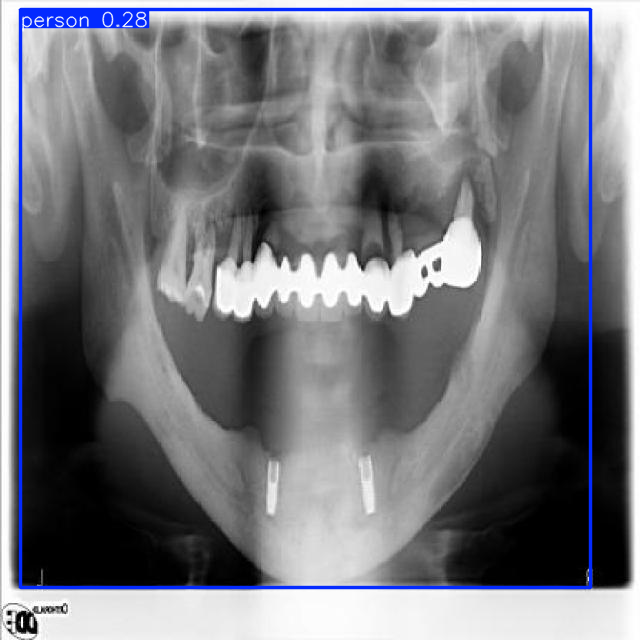

In [4]:
# Load an image (replace with your image path)
image_path = '/content/Implant-Doctor-1/train/images/Bicon-0_jpg.rf.1c3b1ad8eb99fac4b20ee7b66de687d2.jpg'

# Run inference
results = model(image_path)

# Display results
results[0].show()  # Access the first element in the list and call .show()

In [6]:
from ultralytics import YOLO
# Fine-tune the model on your custom dataset
results = model.train(
    data="/content/Implant-Doctor-1/data.yaml",  # Path to your dataset configuration file
    epochs=60,                 # Number of training epochs
    imgsz=640,                  # Image size
    batch=16,                   # Batch size
    device=0,                   # Use GPU (set device=0 for GPU, device='cpu' for CPU)
    workers=4,                  # Number of data loading workers
    lr0=0.01,                   # Initial learning rate
    weight_decay=0.0005,        # Weight decay
    optimizer="SGD",            # Optimizer (SGD, Adam, etc.)
    name="yolo11n_finetuned",
    dropout=0.2,  # helpful for medical images
    augment=True,  # enable augmentation#
)

# Validate the model on the validation set
metrics = model.val()  # Validate the model
print(metrics.box.map)  # Print mAP (mean Average Precision)

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/Implant-Doctor-1/data.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=4, project=None, name=yolo11n_finetuned2, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf

train: Scanning /content/Implant-Doctor-1/train/labels.cache... 5245 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5245/5245 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Implant-Doctor-1/valid/labels.cache... 201 images, 0 backgrounds, 0 corrupt: 100%|██████████| 201/201 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolo11n_finetuned2/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolo11n_finetuned2
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      8.89G      1.445     0.9139      1.372         38        640: 100%|██████████| 328/328 [03:07<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321      0.775      0.897      0.817      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      10.4G      1.433     0.8864      1.361         28        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.37it/s]

                   all        201        321      0.824      0.891      0.862      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      10.4G      1.448     0.9142      1.371         28        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]

                   all        201        321      0.862      0.891      0.867      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      10.4G       1.49     0.9467      1.399         37        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        201        321      0.812      0.912       0.91      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      10.4G      1.467     0.9495      1.391         40        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]

                   all        201        321      0.863      0.903      0.907      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      10.4G      1.453     0.9087      1.382         27        640: 100%|██████████| 328/328 [03:01<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.40it/s]

                   all        201        321      0.923      0.896       0.93      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      10.4G      1.451     0.9078      1.377         38        640: 100%|██████████| 328/328 [03:01<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        201        321      0.795      0.936      0.935      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      10.4G      1.425     0.8743      1.357         42        640: 100%|██████████| 328/328 [03:01<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.41it/s]

                   all        201        321      0.874      0.894      0.892      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      10.4G      1.411     0.8696      1.363         26        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        201        321      0.839      0.909      0.873      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      10.4G      1.416     0.8529      1.347         38        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.23it/s]

                   all        201        321      0.872      0.931      0.907      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      10.4G      1.408     0.8551      1.345         34        640: 100%|██████████| 328/328 [03:01<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321      0.867      0.885      0.917      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      10.4G      1.382     0.8126       1.33         30        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]


                   all        201        321      0.888      0.919      0.947      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      10.4G       1.38     0.8106      1.324         25        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.47it/s]

                   all        201        321      0.879      0.953      0.952       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60      10.4G      1.371     0.7824      1.306         28        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.858       0.94      0.925      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      10.4G      1.359     0.7765      1.306         32        640: 100%|██████████| 328/328 [03:00<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.15it/s]

                   all        201        321      0.896      0.912      0.924      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60      10.4G      1.357     0.7678      1.308         50        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321      0.881      0.875      0.885      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      10.4G      1.334     0.7577      1.285         25        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]

                   all        201        321       0.88      0.895      0.916       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      10.4G      1.332     0.7356      1.279         36        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]

                   all        201        321       0.89      0.898      0.916      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      10.4G        1.3     0.7234      1.275         56        640: 100%|██████████| 328/328 [03:00<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.41it/s]

                   all        201        321      0.862      0.935      0.949      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      10.4G      1.298     0.7178      1.266         33        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.19it/s]

                   all        201        321        0.9      0.942      0.922       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      10.4G      1.286     0.6932      1.255         49        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.14it/s]

                   all        201        321      0.875      0.909        0.9      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      10.4G      1.271      0.689      1.248         40        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]

                   all        201        321      0.909      0.935      0.944      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      10.4G      1.261     0.6803      1.243         27        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321        0.9      0.885      0.907      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      10.4G      1.253     0.6744      1.245         24        640: 100%|██████████| 328/328 [03:00<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321       0.87      0.878      0.897      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      10.4G      1.227     0.6471      1.237         28        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.07it/s]

                   all        201        321      0.843      0.885      0.836      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      10.4G       1.22     0.6384       1.22         32        640: 100%|██████████| 328/328 [03:00<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.848      0.843      0.834      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      10.4G      1.207     0.6315      1.201         38        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]

                   all        201        321      0.907       0.94      0.923      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60      10.4G       1.19     0.6302      1.196         38        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]

                   all        201        321       0.84      0.889      0.858       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      10.4G      1.183      0.616      1.191         32        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        201        321       0.87       0.91      0.886      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      10.4G      1.164     0.6083      1.188         45        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.47it/s]

                   all        201        321      0.864      0.911       0.89       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      10.4G       1.15     0.5925      1.195         40        640: 100%|██████████| 328/328 [03:00<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]

                   all        201        321      0.883      0.935      0.944      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      10.4G      1.152      0.596      1.177         27        640: 100%|██████████| 328/328 [02:59<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.07it/s]

                   all        201        321      0.909       0.94      0.934      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      10.4G      1.135     0.5877      1.166         50        640: 100%|██████████| 328/328 [03:00<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.41it/s]

                   all        201        321      0.916      0.946      0.936      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      10.4G      1.136     0.5901       1.16         33        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.883      0.926      0.895      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      10.4G      1.112     0.5753      1.163         44        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321      0.907      0.939      0.938      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      10.4G      1.094     0.5677      1.151         30        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.27it/s]

                   all        201        321       0.89      0.923      0.886       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      10.4G      1.079      0.556      1.141         38        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.909        0.9       0.91       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      10.4G      1.067     0.5533      1.131         31        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321      0.913      0.921      0.922      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      10.4G      1.058     0.5354      1.123         30        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.36it/s]

                   all        201        321      0.907      0.941      0.916      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      10.4G       1.05     0.5323      1.114         38        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.42it/s]

                   all        201        321      0.914      0.941      0.927      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      10.4G      1.043     0.5357      1.109         56        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        201        321      0.911      0.936      0.928      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      10.4G      1.032      0.531      1.107         43        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.47it/s]

                   all        201        321      0.907      0.917      0.919      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      10.4G      1.008     0.5135      1.093         29        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.43it/s]

                   all        201        321      0.895      0.913      0.907      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      10.4G      1.009      0.511      1.097         42        640: 100%|██████████| 328/328 [03:02<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.47it/s]

                   all        201        321      0.899       0.93      0.907      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      10.4G      0.996      0.506      1.095         50        640: 100%|██████████| 328/328 [03:01<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]

                   all        201        321      0.892      0.936      0.906      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      10.4G      0.977     0.5012      1.079         33        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]

                   all        201        321      0.902      0.948      0.925      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      10.4G     0.9705     0.4982      1.081         38        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.47it/s]

                   all        201        321      0.916      0.936      0.927      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      10.4G     0.9581     0.4896      1.071         42        640: 100%|██████████| 328/328 [03:01<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.37it/s]

                   all        201        321      0.913       0.94      0.925      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      10.4G     0.9437     0.4862      1.068         36        640: 100%|██████████| 328/328 [03:02<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.908      0.941      0.916      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      10.4G     0.9396     0.4754      1.064         26        640: 100%|██████████| 328/328 [03:03<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]

                   all        201        321      0.911      0.941      0.922      0.466


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      10.4G     0.8456     0.3628      1.002         14        640: 100%|██████████| 328/328 [02:59<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.918      0.929      0.931      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      10.4G      0.809     0.3468     0.9827         24        640: 100%|██████████| 328/328 [02:58<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.918      0.939      0.927      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      10.4G     0.7916     0.3405     0.9781         15        640: 100%|██████████| 328/328 [02:58<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.18it/s]

                   all        201        321      0.906      0.926      0.924      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      10.4G       0.78     0.3346     0.9741         19        640: 100%|██████████| 328/328 [02:58<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.903      0.936      0.924      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      10.4G     0.7647     0.3294     0.9664         20        640: 100%|██████████| 328/328 [02:59<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.39it/s]

                   all        201        321      0.916      0.936      0.924      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      10.4G     0.7397     0.3244     0.9481         21        640: 100%|██████████| 328/328 [02:58<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.912      0.929      0.926      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      10.4G     0.7309     0.3179      0.947         19        640: 100%|██████████| 328/328 [02:59<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]

                   all        201        321      0.909      0.939       0.93      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      10.4G     0.7222     0.3166     0.9405         18        640: 100%|██████████| 328/328 [02:58<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]

                   all        201        321      0.917      0.933      0.922      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      10.4G     0.7155     0.3118     0.9405         17        640: 100%|██████████| 328/328 [02:58<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]

                   all        201        321      0.915      0.941       0.93      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      10.4G     0.7044     0.3064     0.9338         17        640: 100%|██████████| 328/328 [02:59<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.47it/s]

                   all        201        321       0.91      0.936      0.927      0.466



60 epochs completed in 3.081 hours.
Optimizer stripped from runs/detect/yolo11n_finetuned2/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/yolo11n_finetuned2/weights/best.pt, 40.5MB

Validating runs/detect/yolo11n_finetuned2/weights/best.pt...
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.04s/it]


                   all        201        321      0.865      0.927      0.942      0.468
                     -        115        194      0.836      0.869      0.897      0.459
Dental Implants 2.0 - v3 2022-05-08 11-29am          9         12      0.861          1      0.976      0.371
This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT         77        115      0.897      0.912      0.953      0.575
Speed: 0.4ms preprocess, 26.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/yolo11n_finetuned2
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs


val: Scanning /content/Implant-Doctor-1/valid/labels.cache... 201 images, 0 backgrounds, 0 corrupt: 100%|██████████| 201/201 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:13<00:00,  1.03s/it]


                   all        201        321      0.863      0.927      0.941      0.471
                     -        115        194      0.837      0.876      0.898       0.46
Dental Implants 2.0 - v3 2022-05-08 11-29am          9         12      0.865          1      0.976      0.375
This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT         77        115      0.888      0.904      0.951      0.578
Speed: 2.5ms preprocess, 53.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/yolo11n_finetuned22
0.4708869053607162



image 1/1 /content/Implant-Doctor-1/train/images/Bicon-0_jpg.rf.1c3b1ad8eb99fac4b20ee7b66de687d2.jpg: 640x640 1 cow, 1 vase, 117.6ms
Speed: 2.3ms preprocess, 117.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


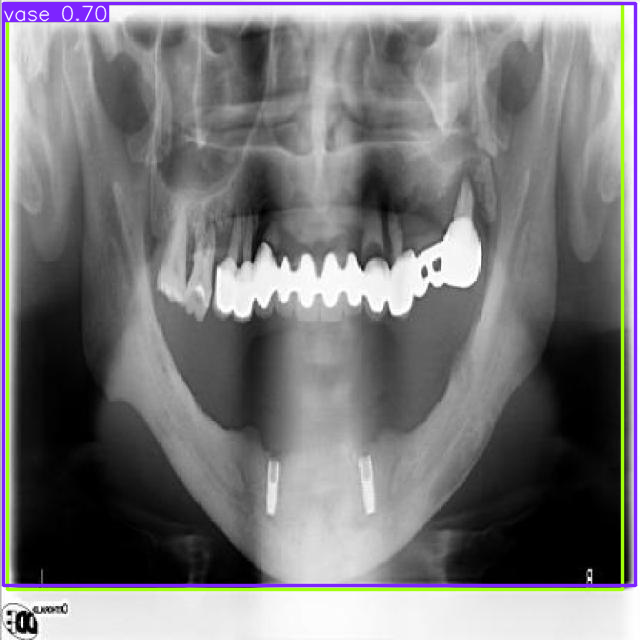

In [9]:
image="/content/Implant-Doctor-1/train/images/Bicon-0_jpg.rf.1c3b1ad8eb99fac4b20ee7b66de687d2.jpg"
results = model(image)
results[0].show()

In [11]:
import cv2
import glob
import os

# Load the trained model
model = YOLO("runs/detect/yolo11n_finetuned2/weights/best.pt")  # Update with your trained model path

# Path to the folder containing test images
image_folder = "/content/Implant-Doctor-1/test/images"  # Change this to your test image folder
output_folder = "./output"  # Change this to where you want to save results

os.makedirs(output_folder, exist_ok=True)

# Get a list of images (limit to 6 images)
image_paths = glob.glob(os.path.join(image_folder, "*.jpg"))[:8]

# Run inference on images
for img_path in image_paths:
    results = model(img_path)  # Run YOLO model on the image

    # Save the result image with bounding boxes
    for result in results:
        img = result.plot()  # Get the image with detections
        output_path = os.path.join(output_folder, os.path.basename(img_path))
        cv2.imwrite(output_path, img)

print("Inference completed. Results saved in:", output_folder)


image 1/1 /content/Implant-Doctor-1/test/images/ITI-14_jpg.rf.9bbbaa171339ae0e73f9c1c242b124ce.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 36.8ms
Speed: 2.0ms preprocess, 36.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-589_jpg.rf.4fddbe1f7cb1dbd8166915b20b8c9e63.jpg: 640x640 1 -, 36.8ms
Speed: 1.8ms preprocess, 36.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-102_jpg.rf.ecbda8acabd5b1b9368ef7ab5030f8d8.jpg: 640x640 2 -s, 35.2ms
Speed: 1.8ms preprocess, 35.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-193_jpg.rf.3568e63d276a831036098828995a0ecf.jpg: 640x640 2 -s, 23.7ms
Speed: 1.7ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Implant-Doctor-1/test/im

In [7]:
from google.colab import files
files.download("/content/runs/detect/yolo11n_finetuned/weights/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

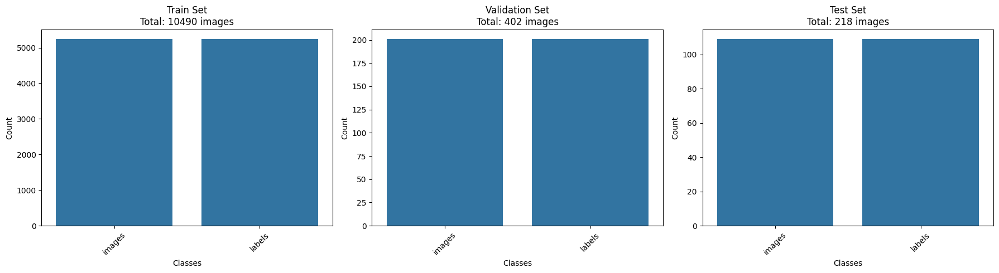

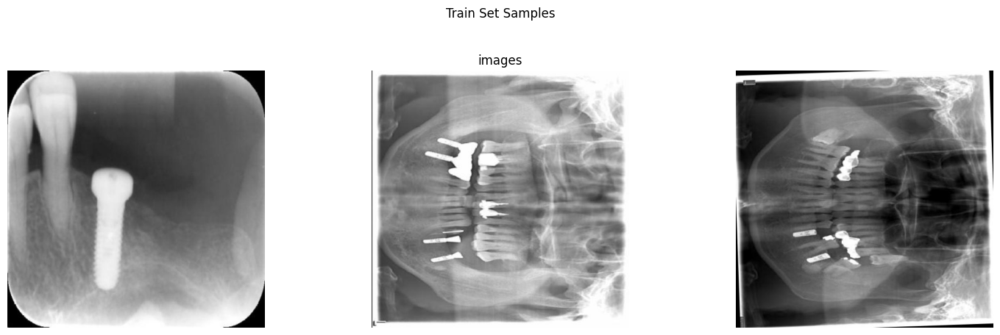

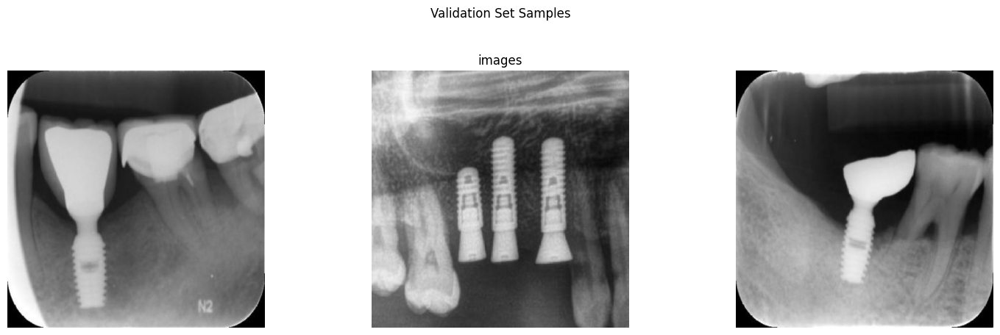

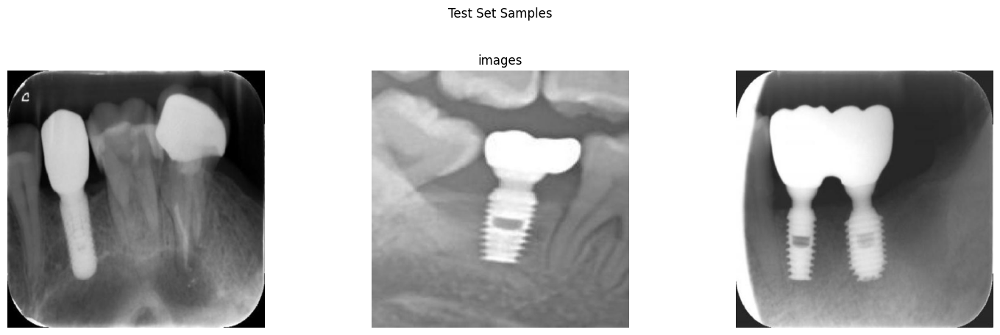

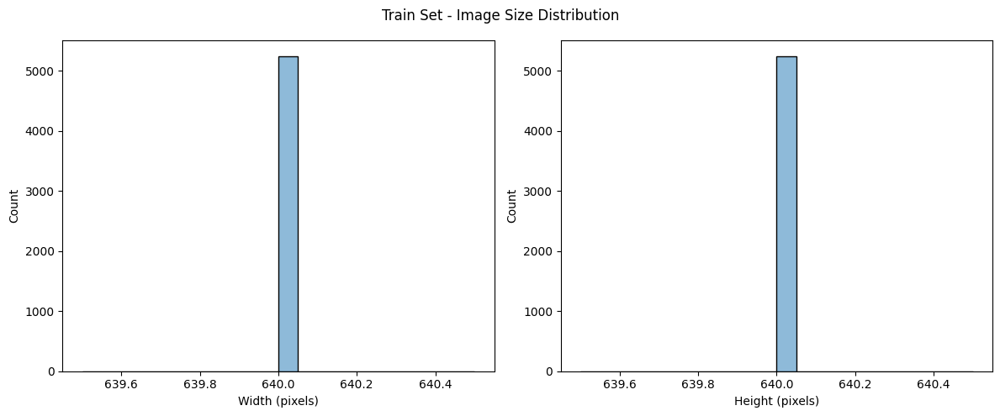

Average dimensions: 640x640
Min dimensions: 640x640
Max dimensions: 640x640


In [8]:
# Standalone Data Visualization for Skin Cancer Classification Dataset
import os
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np

# Set your dataset path here
DATASET_PATH = "/content/Implant-Doctor-1"  # Update this path to your dataset location

def visualize_dataset(dataset_path):
    """Standalone visualization of skin cancer classification dataset"""

    # 1. Class Distribution Visualization
    train_path = os.path.join(dataset_path, "train")
    val_path = os.path.join(dataset_path, "valid")
    test_path = os.path.join(dataset_path, "test")

    def get_class_counts(folder_path):
        if not os.path.exists(folder_path):
            return {}, 0
        classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]
        counts = {cls: len(os.listdir(os.path.join(folder_path, cls))) for cls in classes}
        total = sum(counts.values())
        return counts, total

    train_counts, train_total = get_class_counts(train_path)
    val_counts, val_total = get_class_counts(val_path)
    test_counts, test_total = get_class_counts(test_path)

    # Plot class distribution
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    sns.barplot(x=list(train_counts.keys()), y=list(train_counts.values()))
    plt.title(f"Train Set\nTotal: {train_total} images")
    plt.xlabel("Classes")
    plt.ylabel("Count")
    plt.xticks(rotation=45)

    plt.subplot(1, 3, 2)
    sns.barplot(x=list(val_counts.keys()), y=list(val_counts.values()))
    plt.title(f"Validation Set\nTotal: {val_total} images")
    plt.xlabel("Classes")
    plt.ylabel("Count")
    plt.xticks(rotation=45)

    plt.subplot(1, 3, 3)
    sns.barplot(x=list(test_counts.keys()), y=list(test_counts.values()))
    plt.title(f"Test Set\nTotal: {test_total} images")
    plt.xlabel("Classes")
    plt.ylabel("Count")
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

    # 2. Sample Images Visualization
    def plot_sample_images(folder_path, title):
        if not os.path.exists(folder_path):
            print(f"{title} folder not found at {folder_path}")
            return

        classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]
        plt.figure(figsize=(15, 8))
        plt.suptitle(title, y=1.02)

        samples_per_class = 3
        for i, cls in enumerate(classes):
            class_path = os.path.join(folder_path, cls)
            images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:samples_per_class]

            for j, img_name in enumerate(images):
                img_path = os.path.join(class_path, img_name)
                try:
                    img = Image.open(img_path)
                    ax = plt.subplot(len(classes), samples_per_class, i*samples_per_class + j + 1)
                    plt.imshow(img)
                    plt.title(f"{cls}" if j == 1 else "")
                    plt.axis('off')
                except Exception as e:
                    print(f"Error loading {img_path}: {str(e)}")

        plt.tight_layout()
        plt.show()

    plot_sample_images(train_path, "Train Set Samples")
    plot_sample_images(val_path, "Validation Set Samples")
    plot_sample_images(test_path, "Test Set Samples")

    # 3. Image Size Distribution
    def plot_size_distribution(folder_path, title):
        if not os.path.exists(folder_path):
            print(f"{title} folder not found at {folder_path}")
            return

        widths = []
        heights = []

        for root, _, files in os.walk(folder_path):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    try:
                        with Image.open(os.path.join(root, file)) as img:
                            widths.append(img.width)
                            heights.append(img.height)
                    except:
                        continue

        if not widths:
            print(f"No images found in {folder_path}")
            return

        plt.figure(figsize=(12, 5))
        plt.suptitle(f"{title} - Image Size Distribution")

        plt.subplot(1, 2, 1)
        sns.histplot(widths, bins=20, kde=True)
        plt.xlabel("Width (pixels)")

        plt.subplot(1, 2, 2)
        sns.histplot(heights, bins=20, kde=True)
        plt.xlabel("Height (pixels)")

        plt.tight_layout()
        plt.show()

        print(f"Average dimensions: {np.mean(widths):.0f}x{np.mean(heights):.0f}")
        print(f"Min dimensions: {min(widths)}x{min(heights)}")
        print(f"Max dimensions: {max(widths)}x{max(heights)}")

    plot_size_distribution(train_path, "Train Set")

# Run the visualization
visualize_dataset(DATASET_PATH)


image 1/1 /content/Implant-Doctor-1/test/images/ITI-14_jpg.rf.9bbbaa171339ae0e73f9c1c242b124ce.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


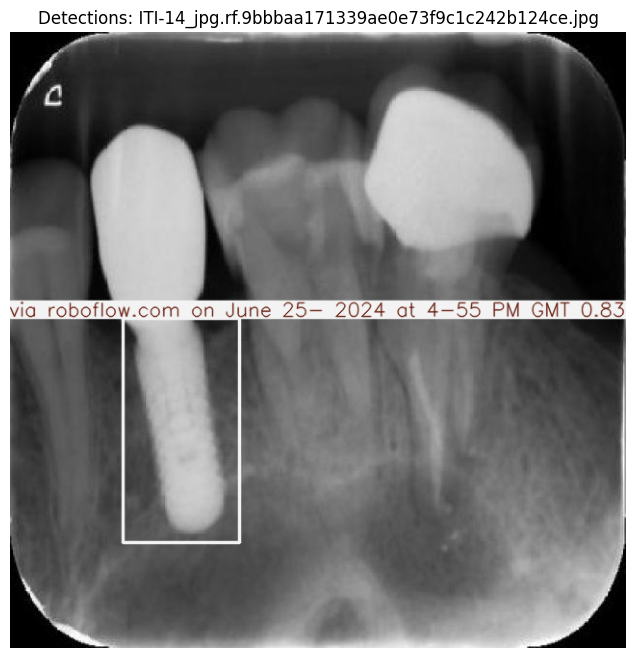

Saved results for ITI-14_jpg.rf.9bbbaa171339ae0e73f9c1c242b124ce.jpg to /content/sample_data/detected_ITI-14_jpg.rf.9bbbaa171339ae0e73f9c1c242b124ce.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-589_jpg.rf.4fddbe1f7cb1dbd8166915b20b8c9e63.jpg: 640x640 1 -, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


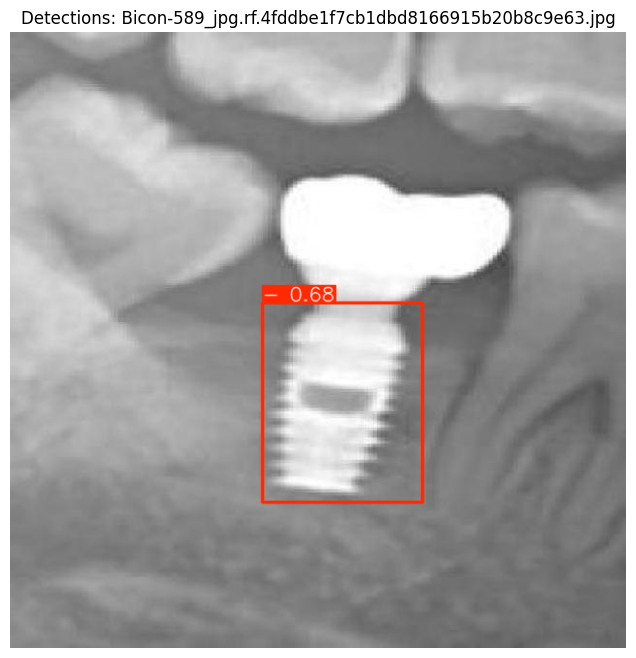

Saved results for Bicon-589_jpg.rf.4fddbe1f7cb1dbd8166915b20b8c9e63.jpg to /content/sample_data/detected_Bicon-589_jpg.rf.4fddbe1f7cb1dbd8166915b20b8c9e63.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-102_jpg.rf.ecbda8acabd5b1b9368ef7ab5030f8d8.jpg: 640x640 2 -s, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


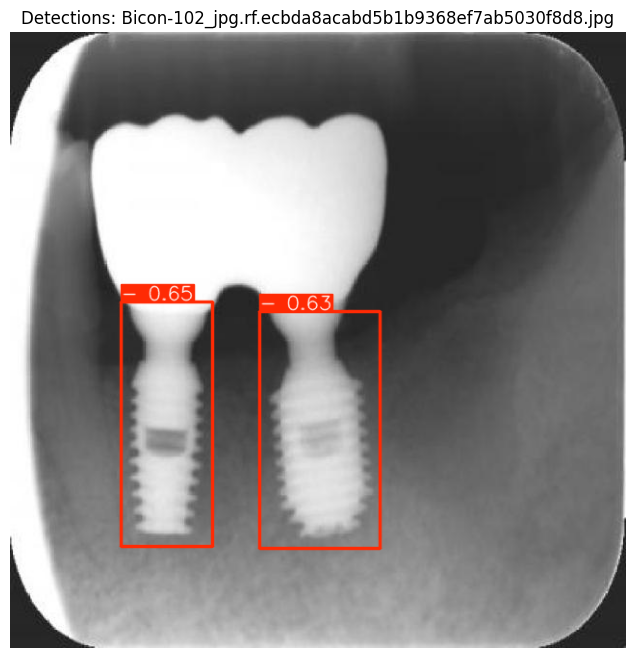

Saved results for Bicon-102_jpg.rf.ecbda8acabd5b1b9368ef7ab5030f8d8.jpg to /content/sample_data/detected_Bicon-102_jpg.rf.ecbda8acabd5b1b9368ef7ab5030f8d8.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-193_jpg.rf.3568e63d276a831036098828995a0ecf.jpg: 640x640 2 -s, 37.0ms
Speed: 2.4ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


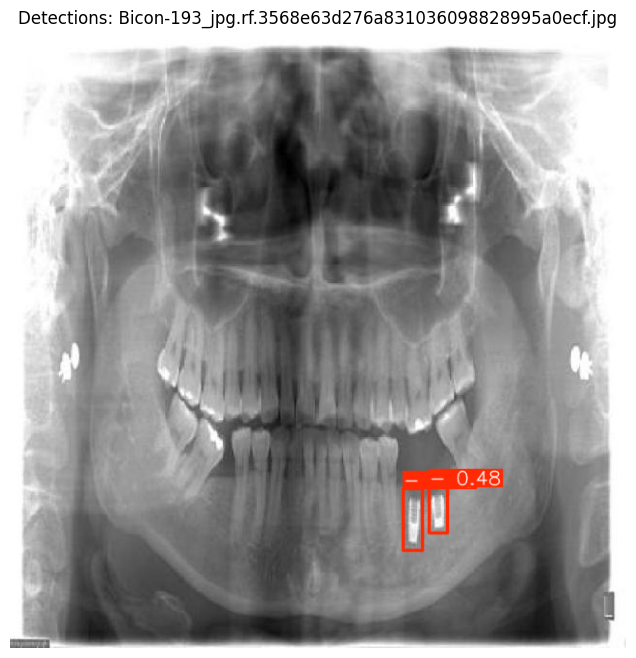

Saved results for Bicon-193_jpg.rf.3568e63d276a831036098828995a0ecf.jpg to /content/sample_data/detected_Bicon-193_jpg.rf.3568e63d276a831036098828995a0ecf.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-367_jpg.rf.882f1ec7703d28e25fea5b4cd1e00517.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


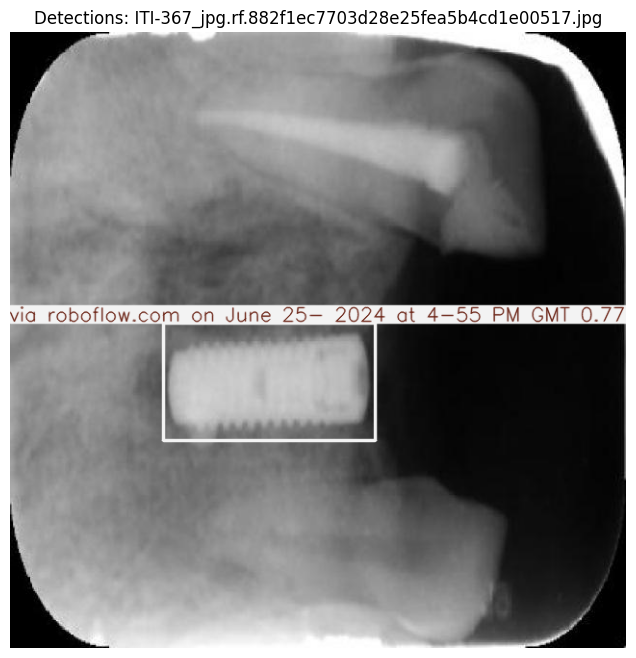

Saved results for ITI-367_jpg.rf.882f1ec7703d28e25fea5b4cd1e00517.jpg to /content/sample_data/detected_ITI-367_jpg.rf.882f1ec7703d28e25fea5b4cd1e00517.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-562_jpg.rf.989336b39bb8076571ddca401b8fbdab.jpg: 640x640 1 -, 37.0ms
Speed: 2.4ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


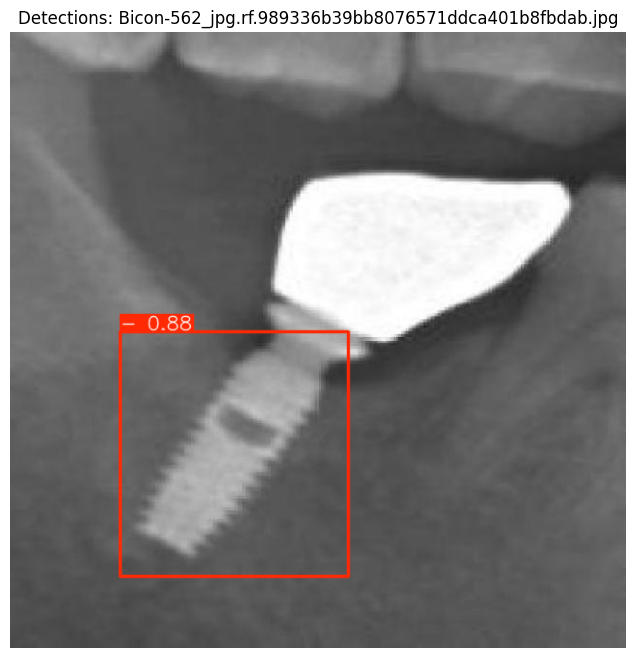

Saved results for Bicon-562_jpg.rf.989336b39bb8076571ddca401b8fbdab.jpg to /content/sample_data/detected_Bicon-562_jpg.rf.989336b39bb8076571ddca401b8fbdab.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-374_jpg.rf.8239cf68a55288842c362f926cc950f5.jpg: 640x640 1 -, 36.9ms
Speed: 2.5ms preprocess, 36.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


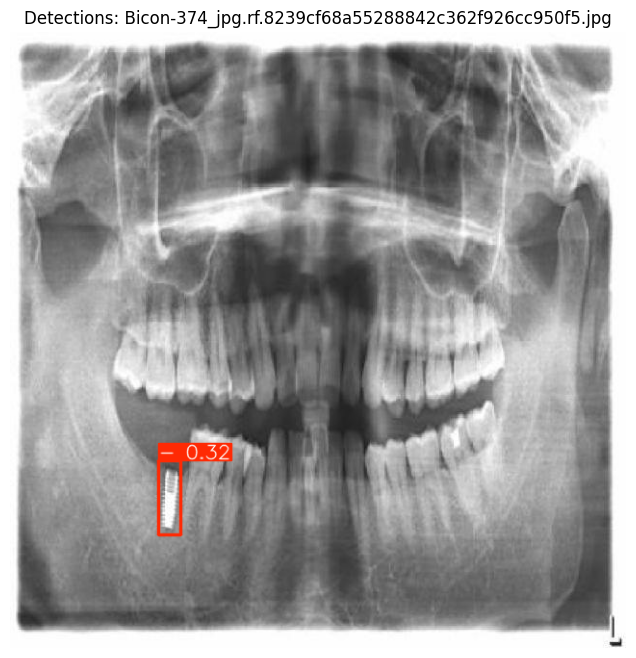

Saved results for Bicon-374_jpg.rf.8239cf68a55288842c362f926cc950f5.jpg to /content/sample_data/detected_Bicon-374_jpg.rf.8239cf68a55288842c362f926cc950f5.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-357_jpg.rf.c3d41106011756dadd1be74807c42162.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


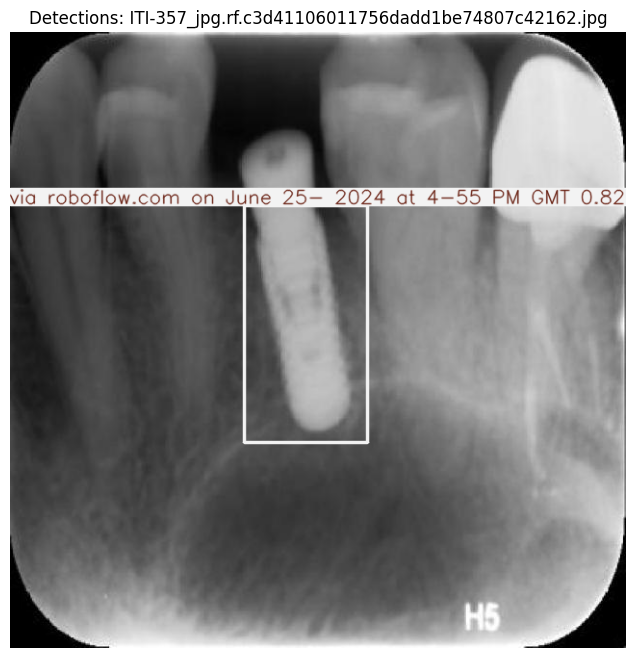

Saved results for ITI-357_jpg.rf.c3d41106011756dadd1be74807c42162.jpg to /content/sample_data/detected_ITI-357_jpg.rf.c3d41106011756dadd1be74807c42162.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-46_jpg.rf.10b609b797352950fcf44d33fe26c836.jpg: 640x640 1 -, 37.0ms
Speed: 2.5ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


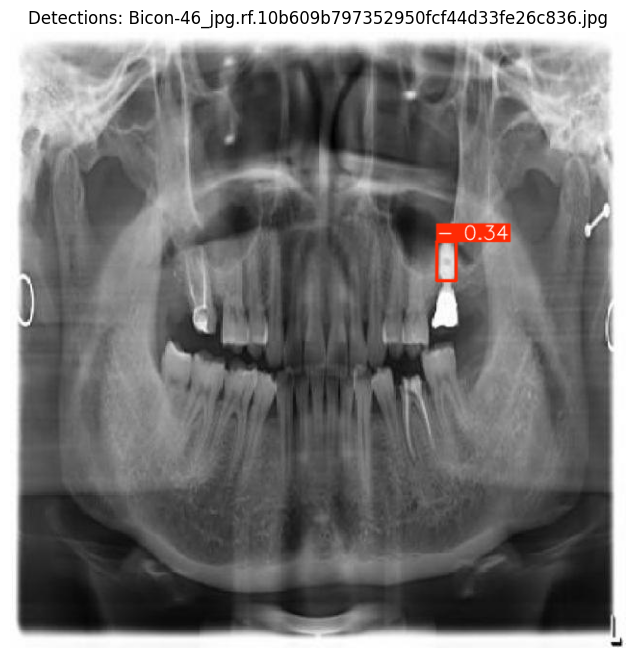

Saved results for Bicon-46_jpg.rf.10b609b797352950fcf44d33fe26c836.jpg to /content/sample_data/detected_Bicon-46_jpg.rf.10b609b797352950fcf44d33fe26c836.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-245_jpg.rf.dff93197f808e4d6a8a8fca85a9d4ac0.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


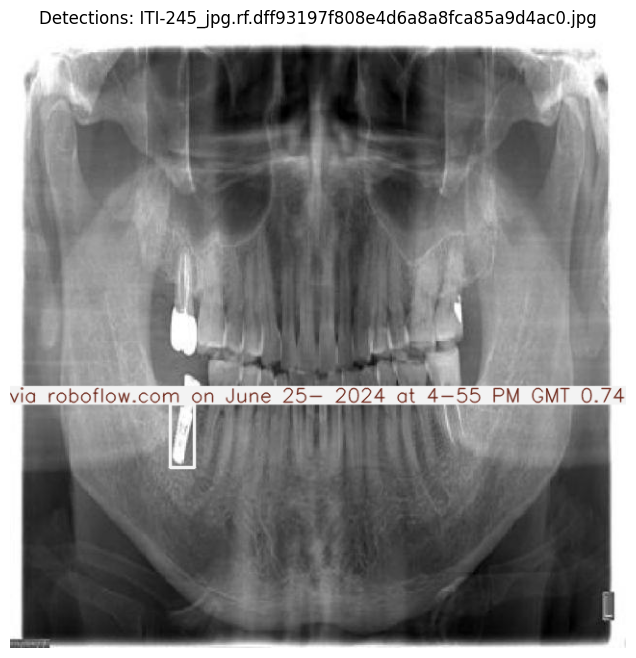

Saved results for ITI-245_jpg.rf.dff93197f808e4d6a8a8fca85a9d4ac0.jpg to /content/sample_data/detected_ITI-245_jpg.rf.dff93197f808e4d6a8a8fca85a9d4ac0.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-438_jpg.rf.57c8fff5ac49f457d232c6c651229c63.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


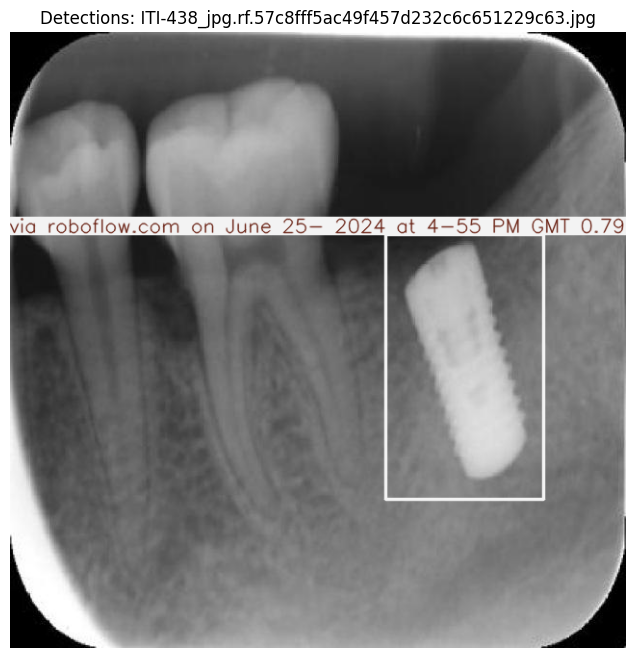

Saved results for ITI-438_jpg.rf.57c8fff5ac49f457d232c6c651229c63.jpg to /content/sample_data/detected_ITI-438_jpg.rf.57c8fff5ac49f457d232c6c651229c63.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-442_jpg.rf.bca6d785e262173c349506b56992c256.jpg: 640x640 1 -, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


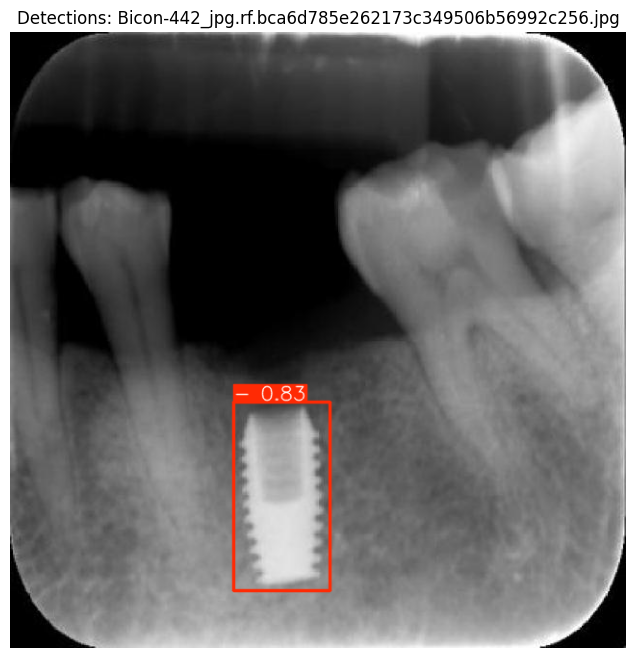

Saved results for Bicon-442_jpg.rf.bca6d785e262173c349506b56992c256.jpg to /content/sample_data/detected_Bicon-442_jpg.rf.bca6d785e262173c349506b56992c256.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-325_jpg.rf.c87aa85d4ba2e6748dc8e5dd97dc6ed4.jpg: 640x640 2 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 37.0ms
Speed: 2.8ms preprocess, 37.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


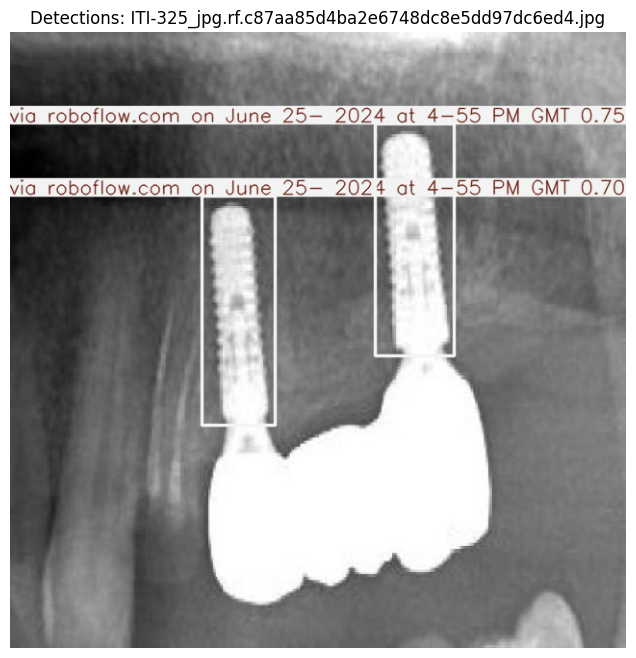

Saved results for ITI-325_jpg.rf.c87aa85d4ba2e6748dc8e5dd97dc6ed4.jpg to /content/sample_data/detected_ITI-325_jpg.rf.c87aa85d4ba2e6748dc8e5dd97dc6ed4.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-348_jpg.rf.52a50efe0e0cf3828bf919a15bda84eb.jpg: 640x640 1 -, 37.0ms
Speed: 2.4ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


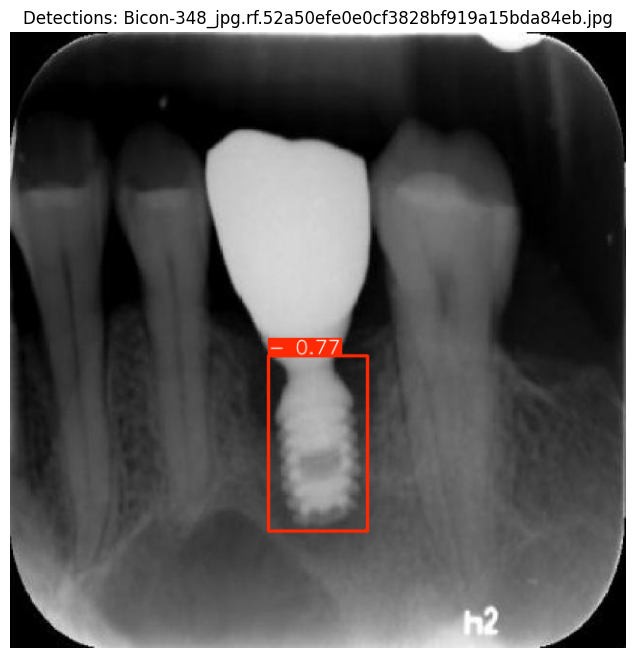

Saved results for Bicon-348_jpg.rf.52a50efe0e0cf3828bf919a15bda84eb.jpg to /content/sample_data/detected_Bicon-348_jpg.rf.52a50efe0e0cf3828bf919a15bda84eb.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-426_jpg.rf.33d1404b001a7f57b03d9e98da3bd9eb.jpg: 640x640 1 -, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


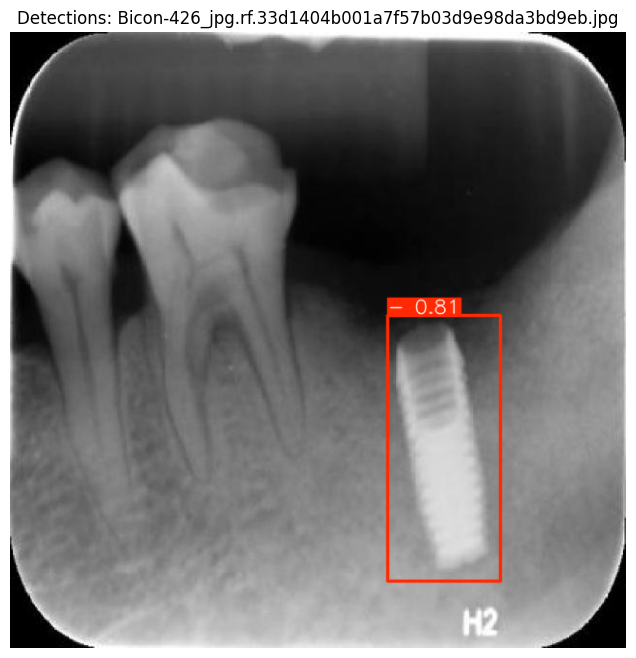

Saved results for Bicon-426_jpg.rf.33d1404b001a7f57b03d9e98da3bd9eb.jpg to /content/sample_data/detected_Bicon-426_jpg.rf.33d1404b001a7f57b03d9e98da3bd9eb.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-363_jpg.rf.e6d1b61ef0dba6672a50f1d4a0f1ecc5.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.1ms
Speed: 2.8ms preprocess, 37.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


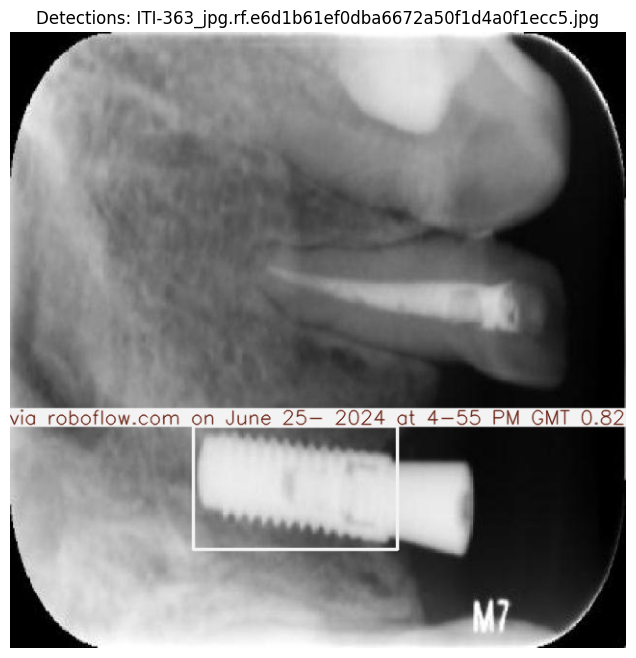

Saved results for ITI-363_jpg.rf.e6d1b61ef0dba6672a50f1d4a0f1ecc5.jpg to /content/sample_data/detected_ITI-363_jpg.rf.e6d1b61ef0dba6672a50f1d4a0f1ecc5.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-335_jpg.rf.599e50d92646c586f14f2ad332a36a5d.jpg: 640x640 1 -, 37.0ms
Speed: 4.0ms preprocess, 37.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


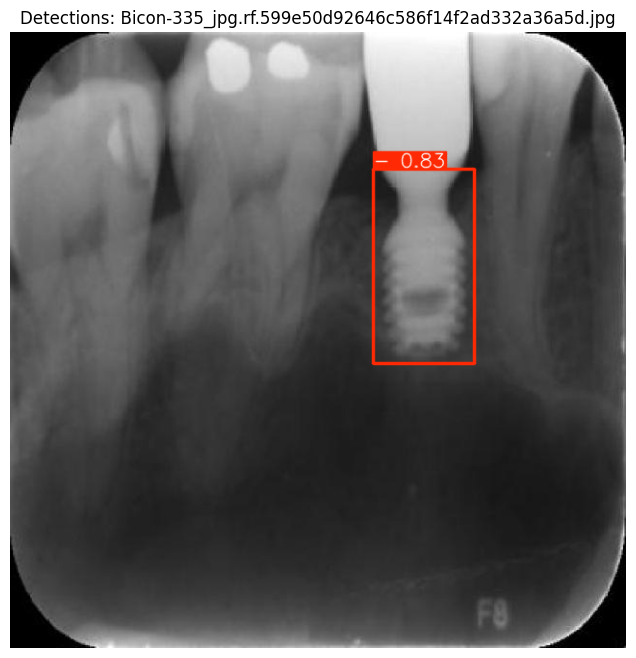

Saved results for Bicon-335_jpg.rf.599e50d92646c586f14f2ad332a36a5d.jpg to /content/sample_data/detected_Bicon-335_jpg.rf.599e50d92646c586f14f2ad332a36a5d.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-429_jpg.rf.e84468c59eff4f10ef2e53ed5af5fcb7.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.9ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


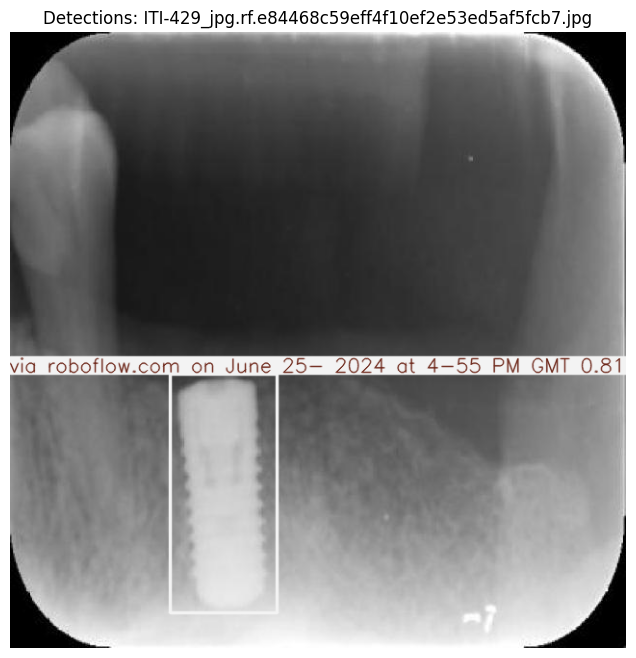

Saved results for ITI-429_jpg.rf.e84468c59eff4f10ef2e53ed5af5fcb7.jpg to /content/sample_data/detected_ITI-429_jpg.rf.e84468c59eff4f10ef2e53ed5af5fcb7.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-476_jpg.rf.7b7b6c8c14db78448365619990989da9.jpg: 640x640 1 -, 37.0ms
Speed: 2.5ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


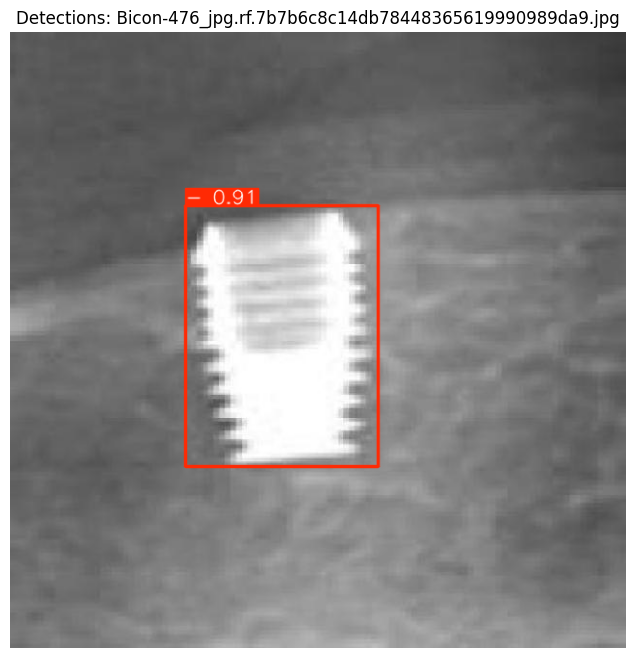

Saved results for Bicon-476_jpg.rf.7b7b6c8c14db78448365619990989da9.jpg to /content/sample_data/detected_Bicon-476_jpg.rf.7b7b6c8c14db78448365619990989da9.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-144_jpg.rf.313b21a22895afe402d687a51fef7dcf.jpg: 640x640 5 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 37.0ms
Speed: 3.3ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


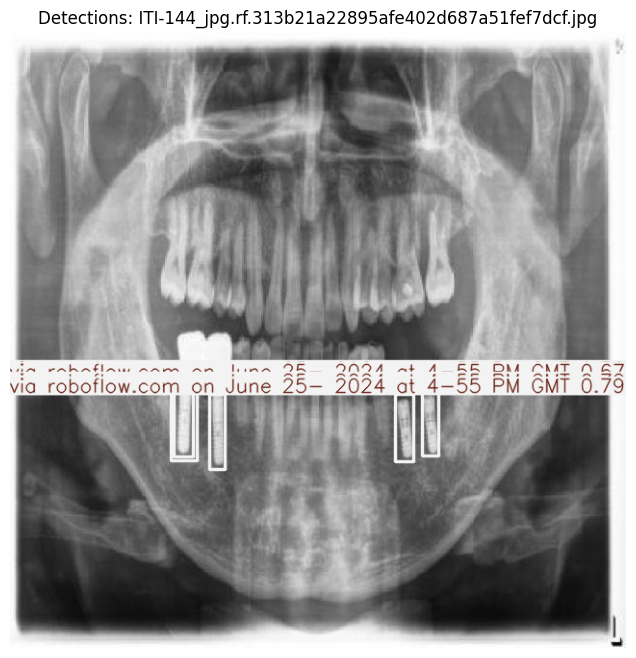

Saved results for ITI-144_jpg.rf.313b21a22895afe402d687a51fef7dcf.jpg to /content/sample_data/detected_ITI-144_jpg.rf.313b21a22895afe402d687a51fef7dcf.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-92_jpg.rf.0cc007864c033d1c08032cded66b055e.jpg: 640x640 1 -, 37.0ms
Speed: 3.1ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


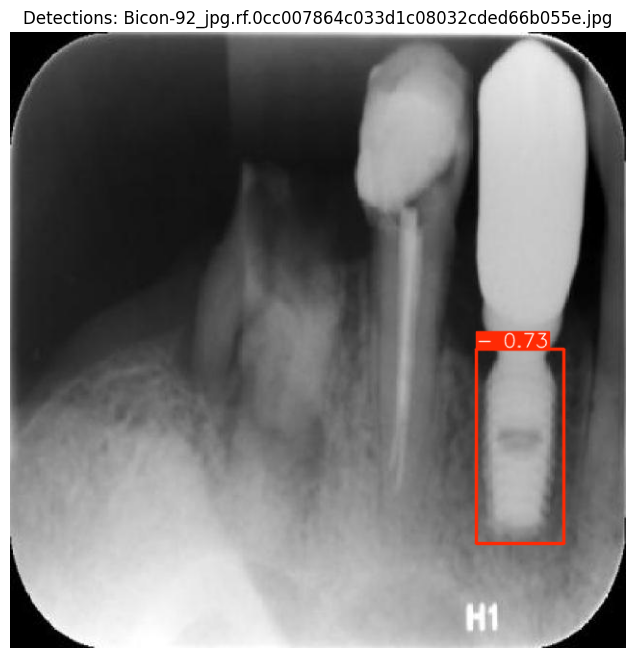

Saved results for Bicon-92_jpg.rf.0cc007864c033d1c08032cded66b055e.jpg to /content/sample_data/detected_Bicon-92_jpg.rf.0cc007864c033d1c08032cded66b055e.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-211_jpg.rf.435b7169c5e5c2daa13703b4b1772c0c.jpg: 640x640 3 -s, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


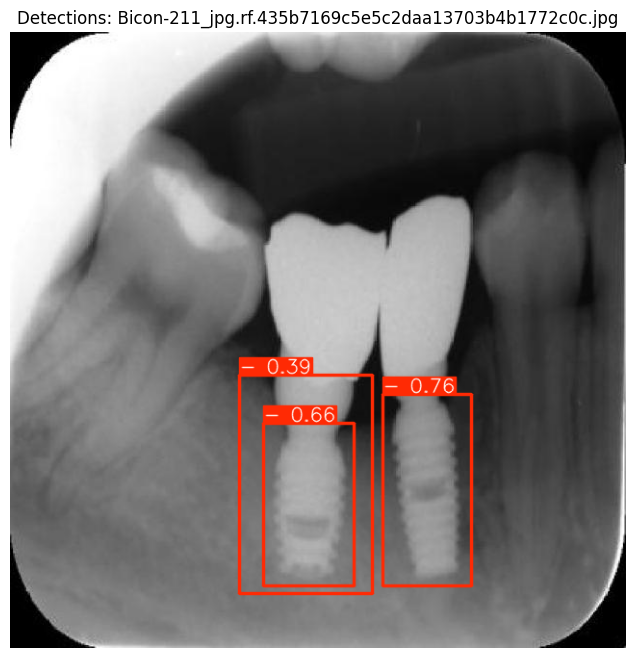

Saved results for Bicon-211_jpg.rf.435b7169c5e5c2daa13703b4b1772c0c.jpg to /content/sample_data/detected_Bicon-211_jpg.rf.435b7169c5e5c2daa13703b4b1772c0c.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-550_jpg.rf.2cc0f74fe433418c2da2309ee1201600.jpg: 640x640 1 -, 38.5ms
Speed: 2.7ms preprocess, 38.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


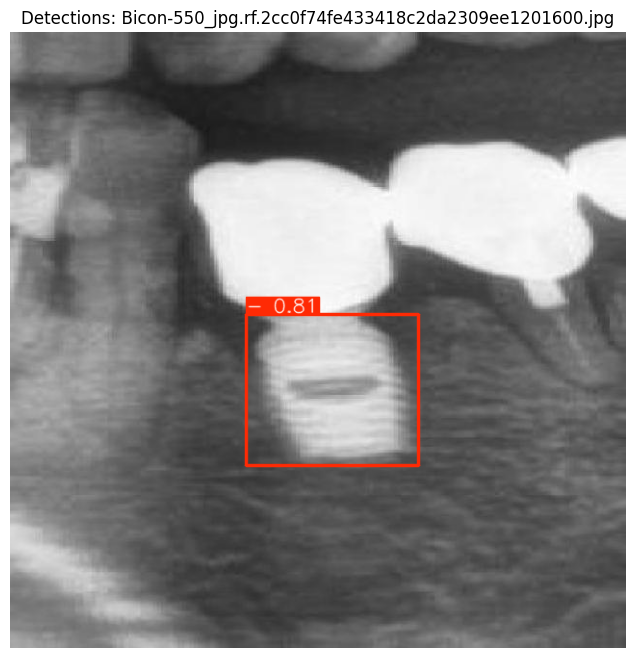

Saved results for Bicon-550_jpg.rf.2cc0f74fe433418c2da2309ee1201600.jpg to /content/sample_data/detected_Bicon-550_jpg.rf.2cc0f74fe433418c2da2309ee1201600.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-318_jpg.rf.4572f5d895c402b9f2ef149ebafba25c.jpg: 640x640 2 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 37.0ms
Speed: 4.9ms preprocess, 37.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


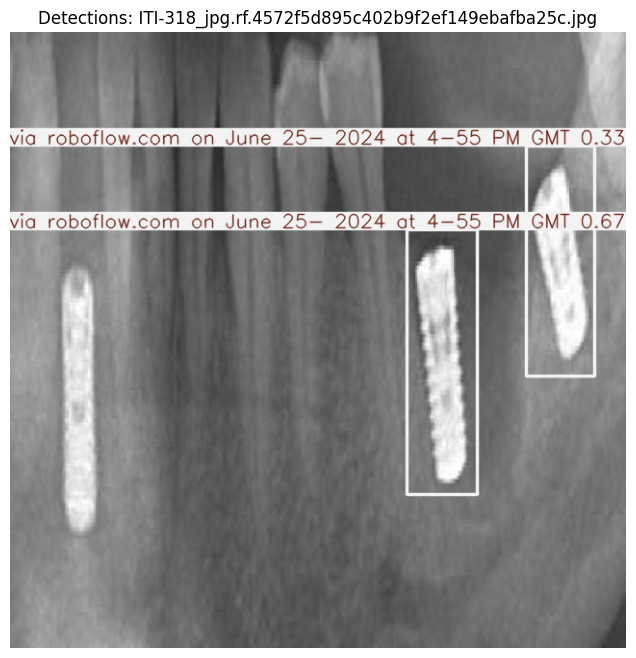

Saved results for ITI-318_jpg.rf.4572f5d895c402b9f2ef149ebafba25c.jpg to /content/sample_data/detected_ITI-318_jpg.rf.4572f5d895c402b9f2ef149ebafba25c.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-24_jpg.rf.7528a52e4370eb59af9d37f7e87ecfff.jpg: 640x640 2 -s, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


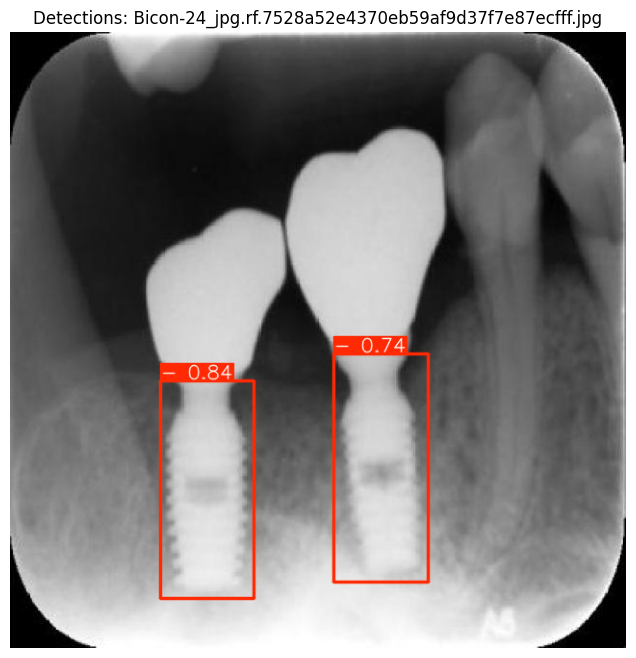

Saved results for Bicon-24_jpg.rf.7528a52e4370eb59af9d37f7e87ecfff.jpg to /content/sample_data/detected_Bicon-24_jpg.rf.7528a52e4370eb59af9d37f7e87ecfff.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-174_jpg.rf.3cb8117991ded93125d8f4a6468acfa6.jpg: 640x640 1 -, 38.0ms
Speed: 4.5ms preprocess, 38.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


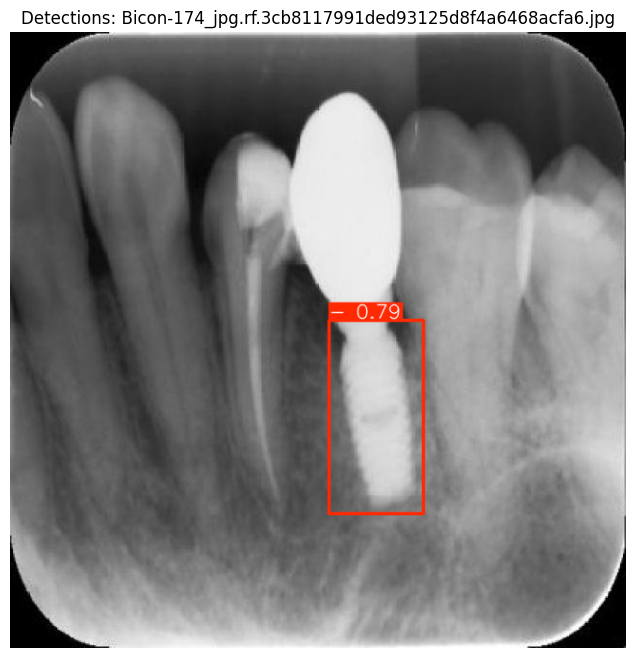

Saved results for Bicon-174_jpg.rf.3cb8117991ded93125d8f4a6468acfa6.jpg to /content/sample_data/detected_Bicon-174_jpg.rf.3cb8117991ded93125d8f4a6468acfa6.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-400_jpg.rf.88eb60d5b3e570cd6877664970c0d4d1.jpg: 640x640 1 -, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


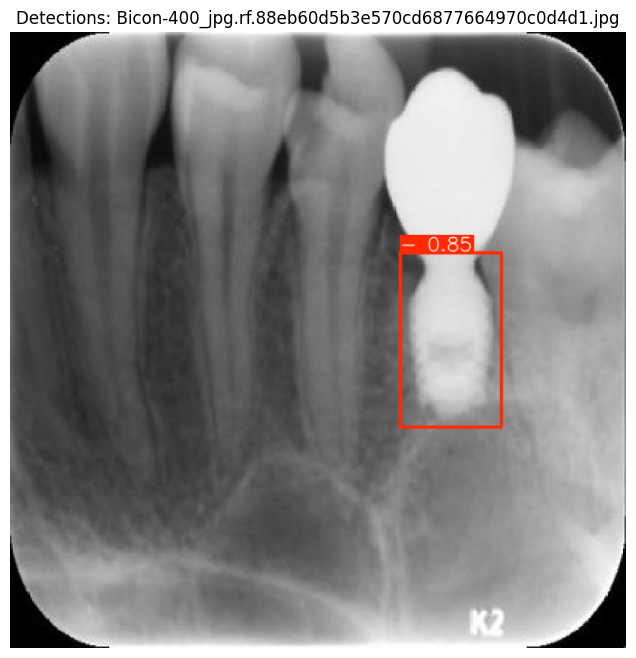

Saved results for Bicon-400_jpg.rf.88eb60d5b3e570cd6877664970c0d4d1.jpg to /content/sample_data/detected_Bicon-400_jpg.rf.88eb60d5b3e570cd6877664970c0d4d1.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-282_jpg.rf.2afe81decd2a3d291fbff8e4c6658552.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 36.9ms
Speed: 2.5ms preprocess, 36.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


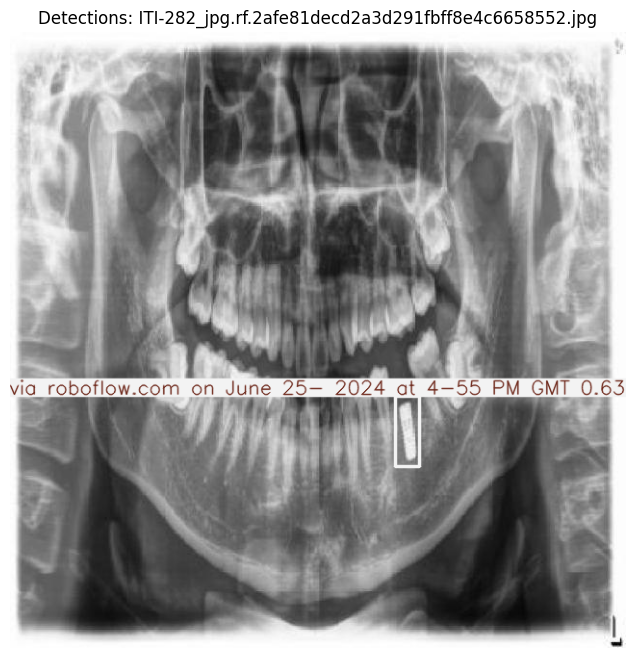

Saved results for ITI-282_jpg.rf.2afe81decd2a3d291fbff8e4c6658552.jpg to /content/sample_data/detected_ITI-282_jpg.rf.2afe81decd2a3d291fbff8e4c6658552.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-445_jpg.rf.4441ed81c38587f7aa6c47ffede80ffb.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 3.2ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


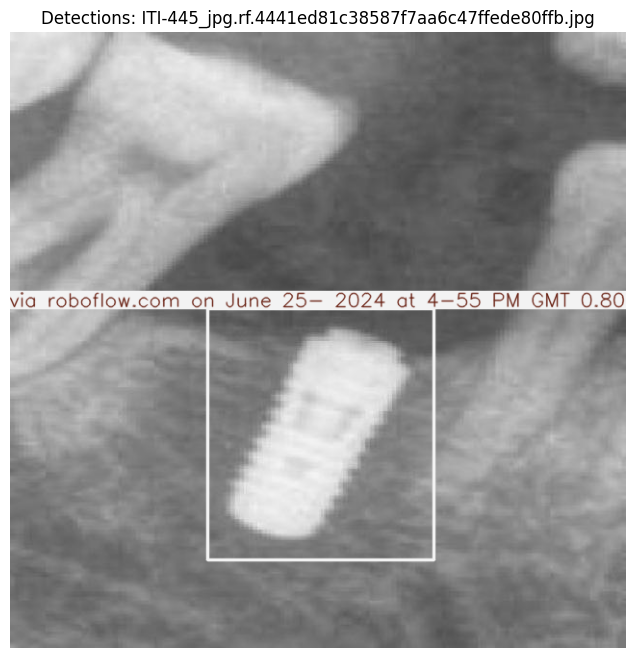

Saved results for ITI-445_jpg.rf.4441ed81c38587f7aa6c47ffede80ffb.jpg to /content/sample_data/detected_ITI-445_jpg.rf.4441ed81c38587f7aa6c47ffede80ffb.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-631_jpg.rf.0268fd25362fc4f7aecddb743f0b38a2.jpg: 640x640 1 -, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


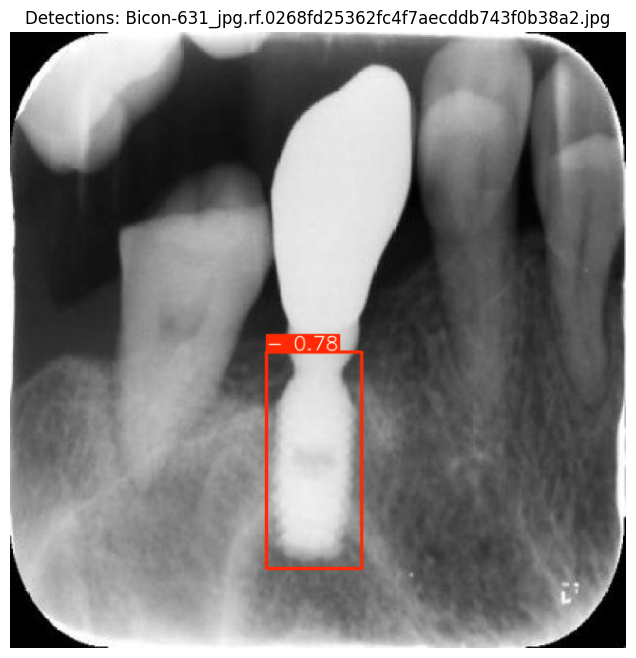

Saved results for Bicon-631_jpg.rf.0268fd25362fc4f7aecddb743f0b38a2.jpg to /content/sample_data/detected_Bicon-631_jpg.rf.0268fd25362fc4f7aecddb743f0b38a2.jpg

image 1/1 /content/Implant-Doctor-1/test/images/bego-61_jpg.rf.5abae5b95fcdc1f2d86f65a35da71afd.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.5ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


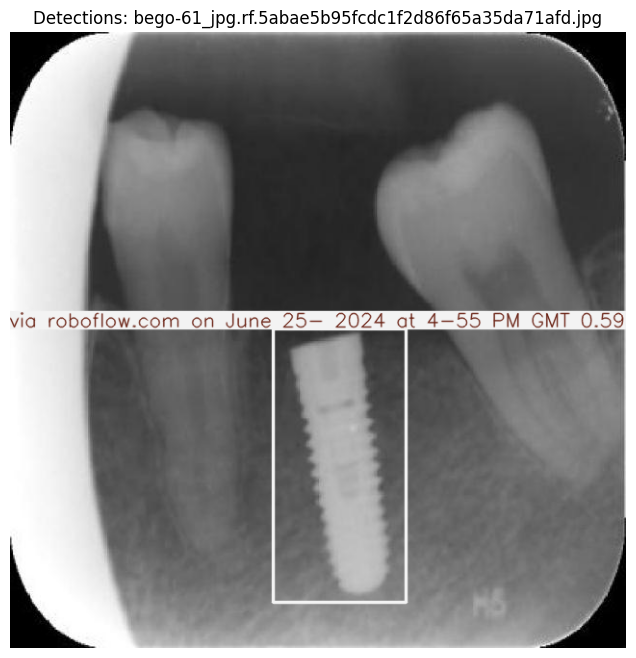

Saved results for bego-61_jpg.rf.5abae5b95fcdc1f2d86f65a35da71afd.jpg to /content/sample_data/detected_bego-61_jpg.rf.5abae5b95fcdc1f2d86f65a35da71afd.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-328_jpg.rf.69a99244ecf535757f12118e230a951e.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 3.2ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


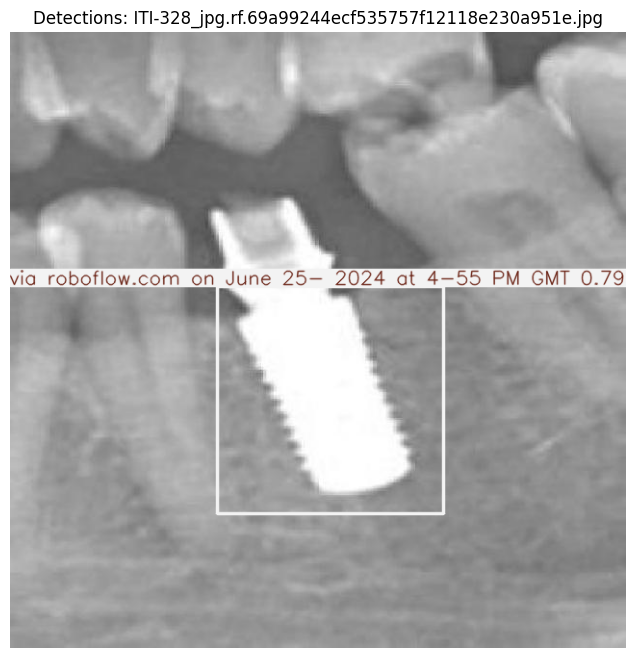

Saved results for ITI-328_jpg.rf.69a99244ecf535757f12118e230a951e.jpg to /content/sample_data/detected_ITI-328_jpg.rf.69a99244ecf535757f12118e230a951e.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-393_jpg.rf.9b6ba6cb2aa7af9dba61820279679ae5.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.9ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


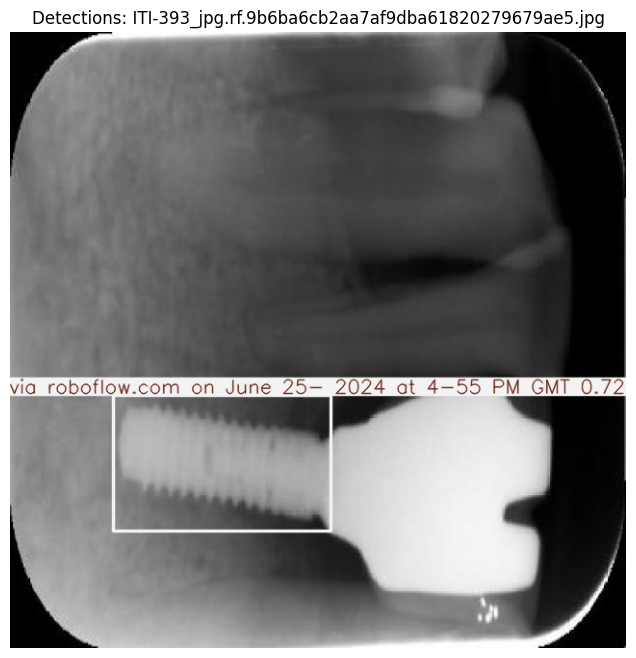

Saved results for ITI-393_jpg.rf.9b6ba6cb2aa7af9dba61820279679ae5.jpg to /content/sample_data/detected_ITI-393_jpg.rf.9b6ba6cb2aa7af9dba61820279679ae5.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-99_jpg.rf.82b59623e6a1f0dc2d35f11bbdf9f98e.jpg: 640x640 3 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 37.0ms
Speed: 2.5ms preprocess, 37.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


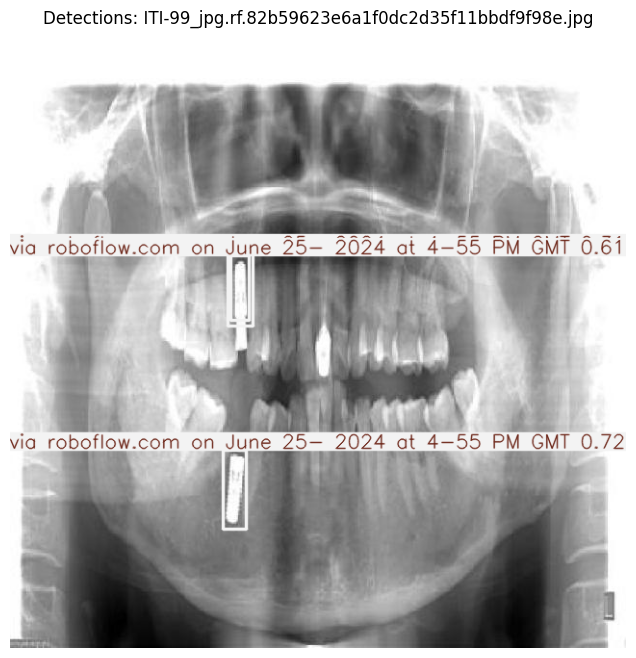

Saved results for ITI-99_jpg.rf.82b59623e6a1f0dc2d35f11bbdf9f98e.jpg to /content/sample_data/detected_ITI-99_jpg.rf.82b59623e6a1f0dc2d35f11bbdf9f98e.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-112_jpg.rf.dc73f38880af1a5538ae0774a588740d.jpg: 640x640 7 -s, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


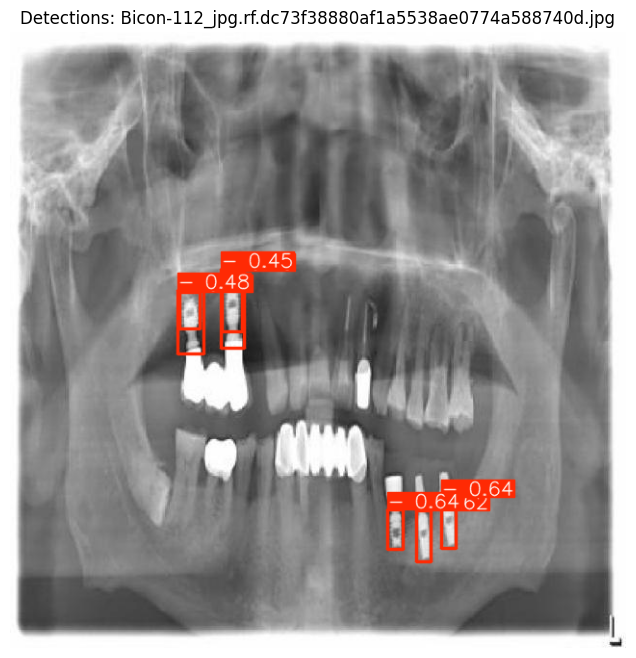

Saved results for Bicon-112_jpg.rf.dc73f38880af1a5538ae0774a588740d.jpg to /content/sample_data/detected_Bicon-112_jpg.rf.dc73f38880af1a5538ae0774a588740d.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-320_jpg.rf.5d779bb85744c03d3158e21efd728a19.jpg: 640x640 1 -, 37.0ms
Speed: 3.0ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


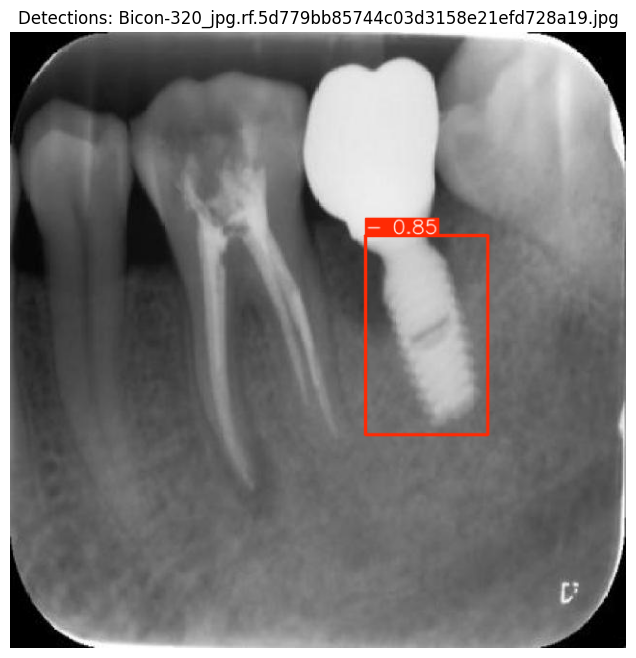

Saved results for Bicon-320_jpg.rf.5d779bb85744c03d3158e21efd728a19.jpg to /content/sample_data/detected_Bicon-320_jpg.rf.5d779bb85744c03d3158e21efd728a19.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-579_jpg.rf.9dfa5fc8d1ca9186227324cf16733258.jpg: 640x640 2 -s, 37.0ms
Speed: 3.0ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


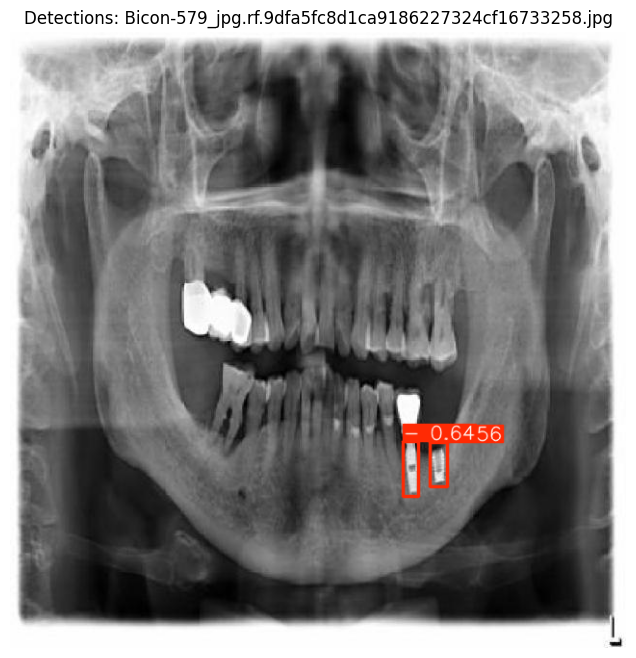

Saved results for Bicon-579_jpg.rf.9dfa5fc8d1ca9186227324cf16733258.jpg to /content/sample_data/detected_Bicon-579_jpg.rf.9dfa5fc8d1ca9186227324cf16733258.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-548_jpg.rf.99af2dd4760469694330218ed015a390.jpg: 640x640 1 -, 37.0ms
Speed: 2.5ms preprocess, 37.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


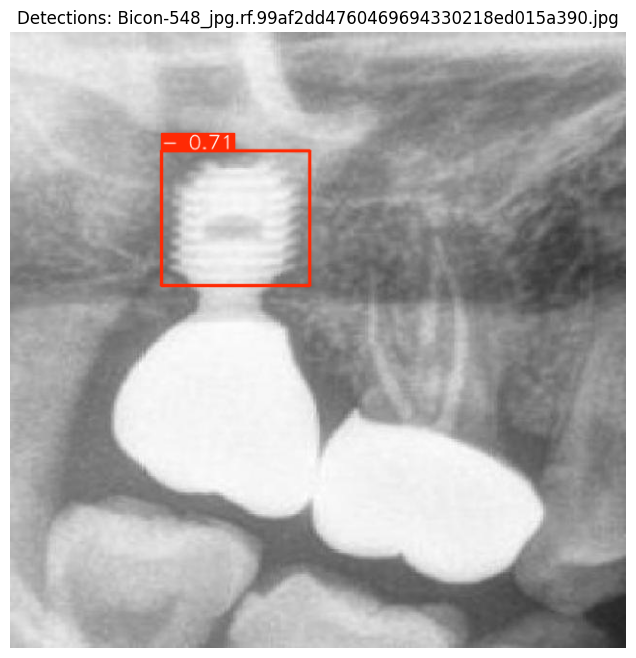

Saved results for Bicon-548_jpg.rf.99af2dd4760469694330218ed015a390.jpg to /content/sample_data/detected_Bicon-548_jpg.rf.99af2dd4760469694330218ed015a390.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-293_jpg.rf.2dd9c8f04339bcba7700ae107c8a22ae.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 38.8ms
Speed: 6.9ms preprocess, 38.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


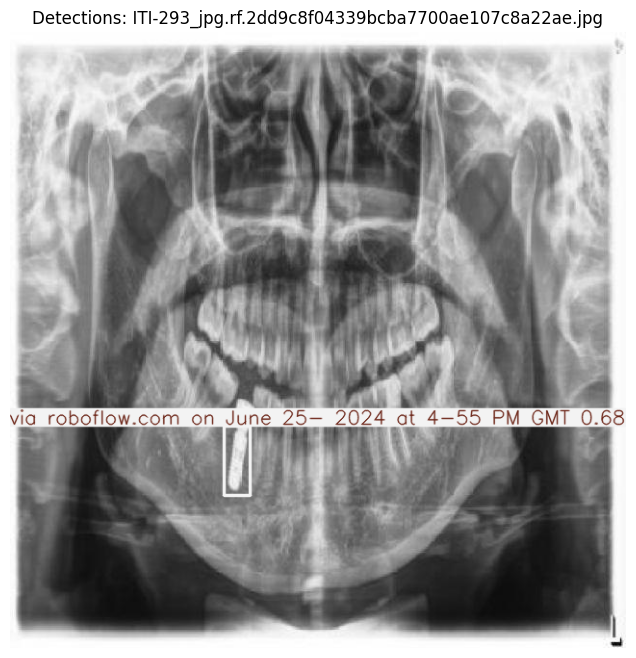

Saved results for ITI-293_jpg.rf.2dd9c8f04339bcba7700ae107c8a22ae.jpg to /content/sample_data/detected_ITI-293_jpg.rf.2dd9c8f04339bcba7700ae107c8a22ae.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-444_jpg.rf.e6d74d8fc6914b63d25bdf690dc518c6.jpg: 640x640 1 -, 36.9ms
Speed: 2.6ms preprocess, 36.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


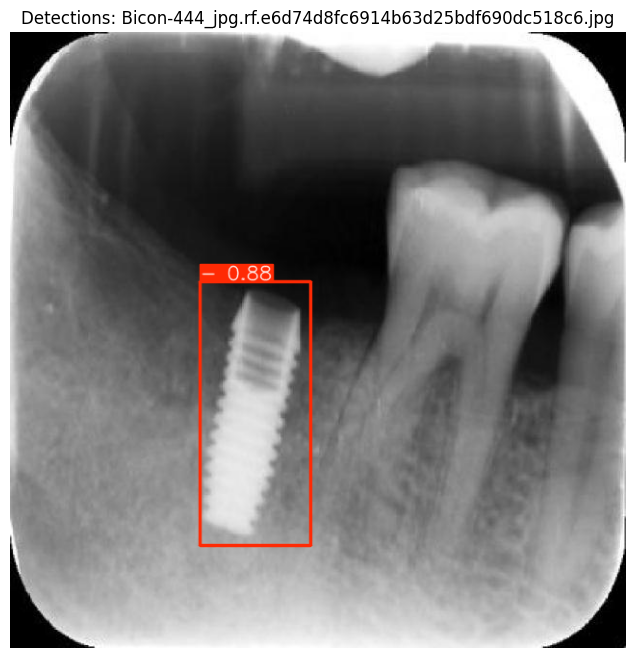

Saved results for Bicon-444_jpg.rf.e6d74d8fc6914b63d25bdf690dc518c6.jpg to /content/sample_data/detected_Bicon-444_jpg.rf.e6d74d8fc6914b63d25bdf690dc518c6.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-221_jpg.rf.691ca41a3b473192f12c7a7d3f126bfc.jpg: 640x640 1 -, 37.0ms
Speed: 2.8ms preprocess, 37.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


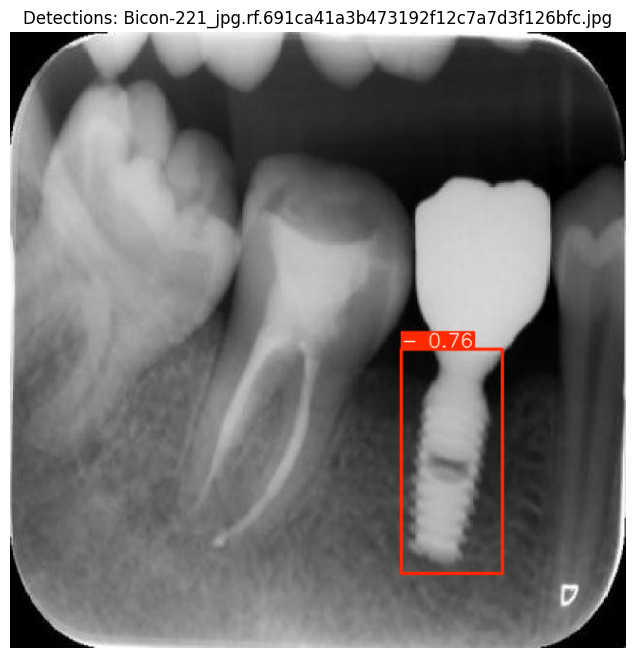

Saved results for Bicon-221_jpg.rf.691ca41a3b473192f12c7a7d3f126bfc.jpg to /content/sample_data/detected_Bicon-221_jpg.rf.691ca41a3b473192f12c7a7d3f126bfc.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-83_jpg.rf.fb09b85209adee81b37780b002078b9b.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.5ms preprocess, 37.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


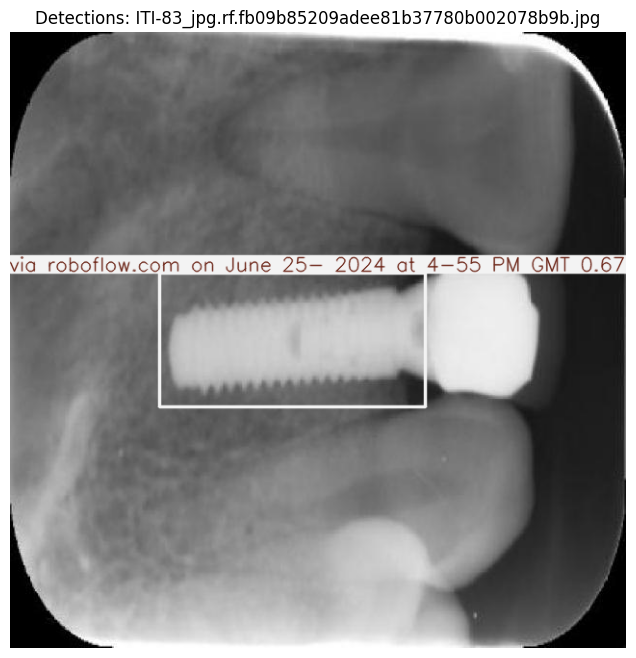

Saved results for ITI-83_jpg.rf.fb09b85209adee81b37780b002078b9b.jpg to /content/sample_data/detected_ITI-83_jpg.rf.fb09b85209adee81b37780b002078b9b.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-221_jpg.rf.c13ac6f6bb44844804cbb693db87b079.jpg: 640x640 4 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)


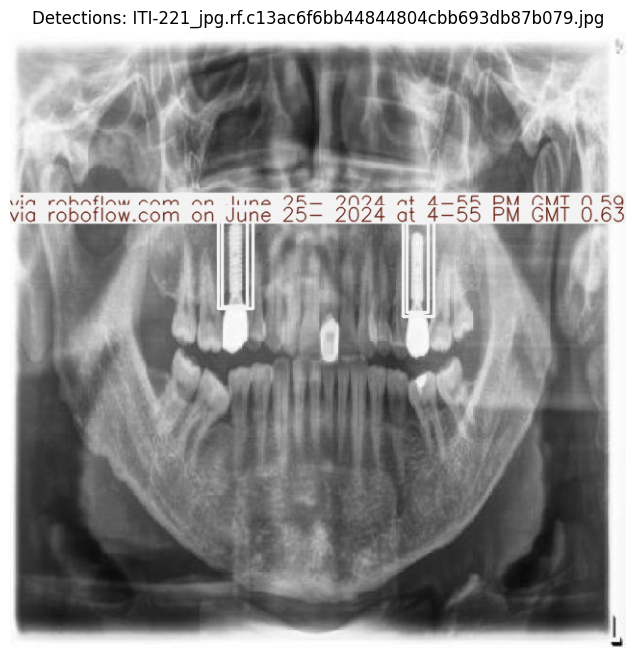

Saved results for ITI-221_jpg.rf.c13ac6f6bb44844804cbb693db87b079.jpg to /content/sample_data/detected_ITI-221_jpg.rf.c13ac6f6bb44844804cbb693db87b079.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-475_jpg.rf.3b18ddc5ce6200b8b1193f49b34593f1.jpg: 640x640 2 -s, 37.1ms
Speed: 2.7ms preprocess, 37.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


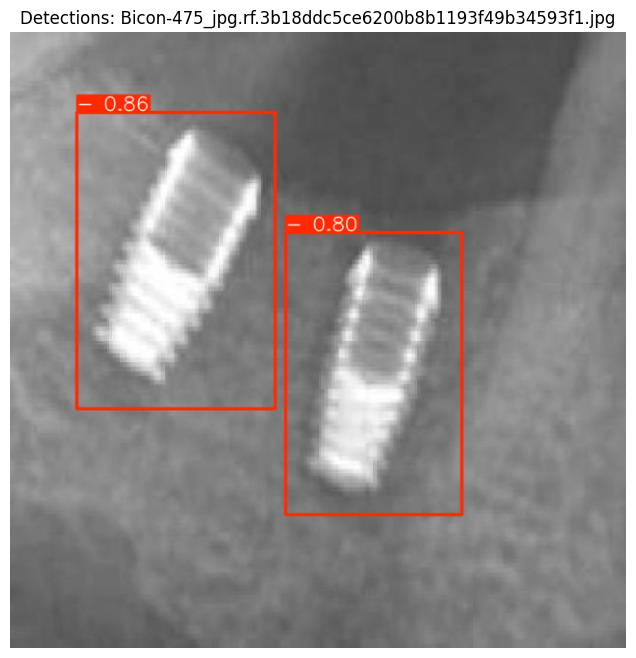

Saved results for Bicon-475_jpg.rf.3b18ddc5ce6200b8b1193f49b34593f1.jpg to /content/sample_data/detected_Bicon-475_jpg.rf.3b18ddc5ce6200b8b1193f49b34593f1.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-456_jpg.rf.b8ed7b55a78ddf9bc459e798813a0da4.jpg: 640x640 1 -, 37.0ms
Speed: 2.9ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


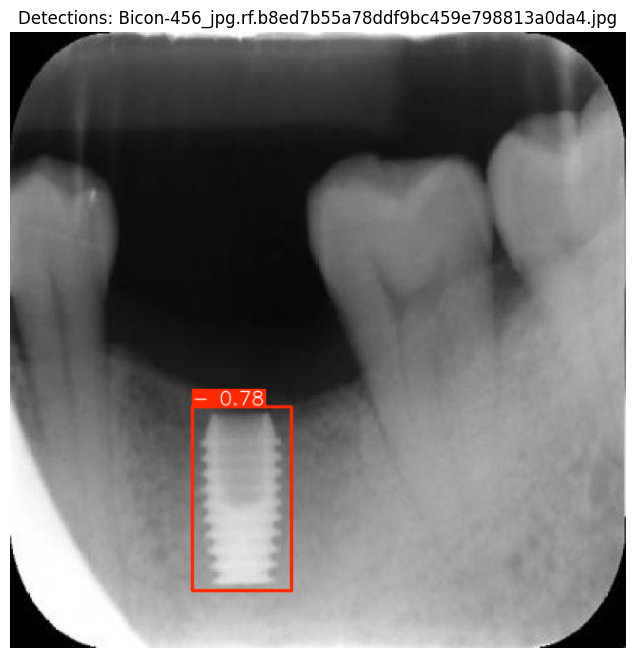

Saved results for Bicon-456_jpg.rf.b8ed7b55a78ddf9bc459e798813a0da4.jpg to /content/sample_data/detected_Bicon-456_jpg.rf.b8ed7b55a78ddf9bc459e798813a0da4.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-384_jpg.rf.fd89867a965d8c2a4af29320a231ac2a.jpg: 640x640 2 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 37.0ms
Speed: 2.4ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


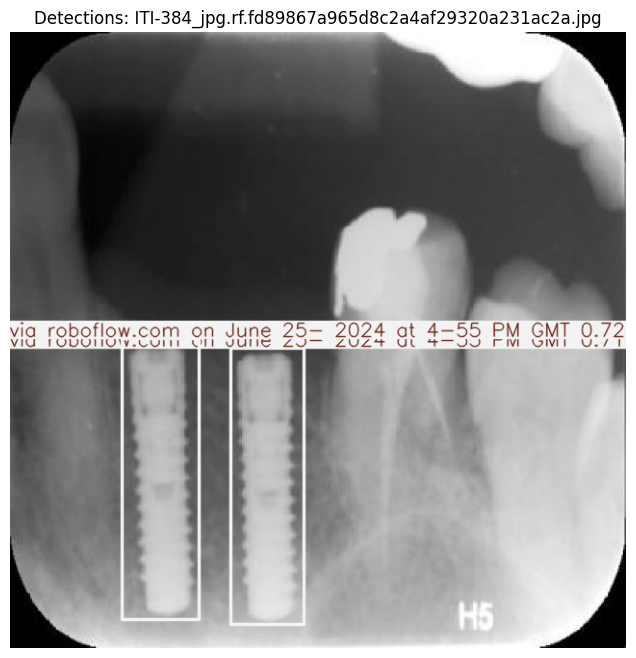

Saved results for ITI-384_jpg.rf.fd89867a965d8c2a4af29320a231ac2a.jpg to /content/sample_data/detected_ITI-384_jpg.rf.fd89867a965d8c2a4af29320a231ac2a.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-182_jpg.rf.c665a0c01dcb738c89842668e4cae246.jpg: 640x640 3 -s, 37.0ms
Speed: 2.8ms preprocess, 37.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


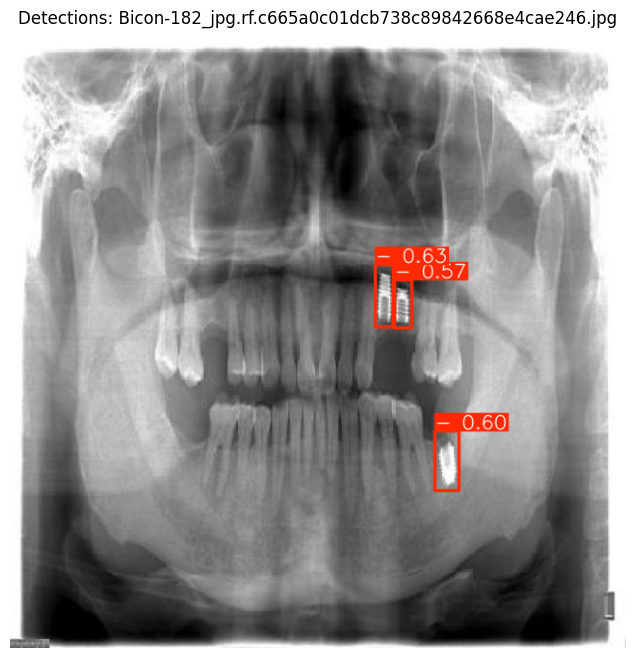

Saved results for Bicon-182_jpg.rf.c665a0c01dcb738c89842668e4cae246.jpg to /content/sample_data/detected_Bicon-182_jpg.rf.c665a0c01dcb738c89842668e4cae246.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-225_jpg.rf.78377363ba18f93ae996978a91489dce.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 3.1ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


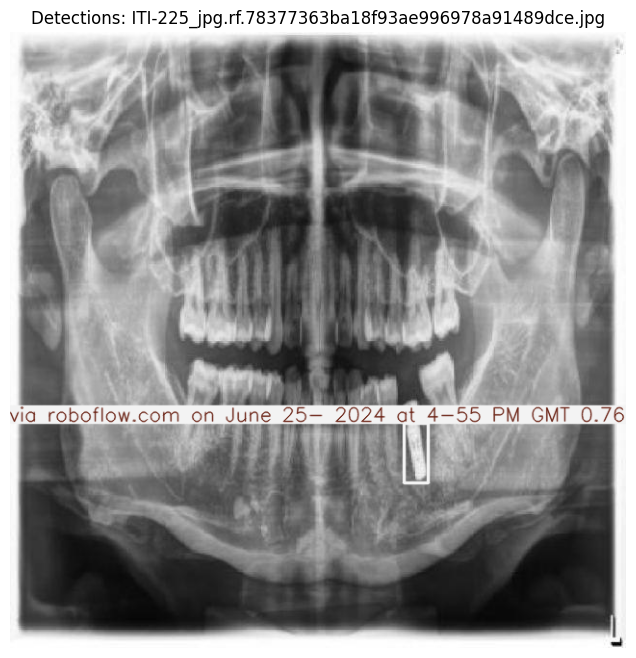

Saved results for ITI-225_jpg.rf.78377363ba18f93ae996978a91489dce.jpg to /content/sample_data/detected_ITI-225_jpg.rf.78377363ba18f93ae996978a91489dce.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-232_jpg.rf.07d98768731ecf963b89614bef7b0250.jpg: 640x640 2 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMTs, 38.0ms
Speed: 2.5ms preprocess, 38.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


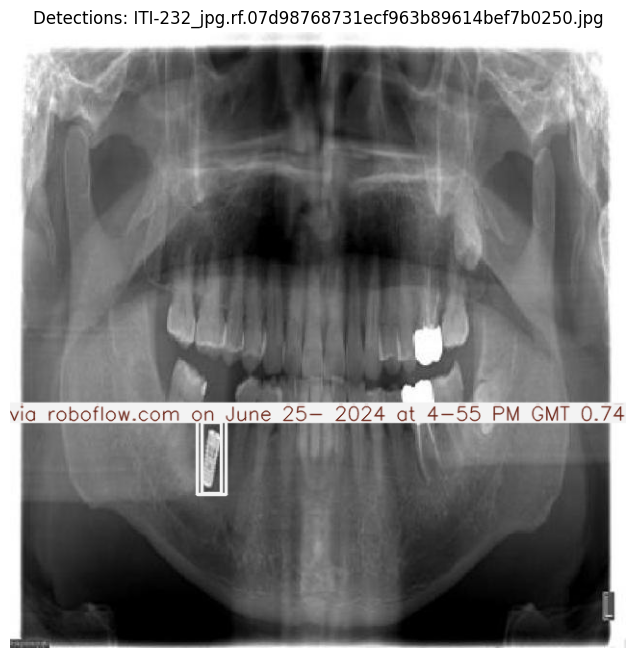

Saved results for ITI-232_jpg.rf.07d98768731ecf963b89614bef7b0250.jpg to /content/sample_data/detected_ITI-232_jpg.rf.07d98768731ecf963b89614bef7b0250.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-69_jpg.rf.490757cb924ab3ac26d35183653d1804.jpg: 640x640 4 -s, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


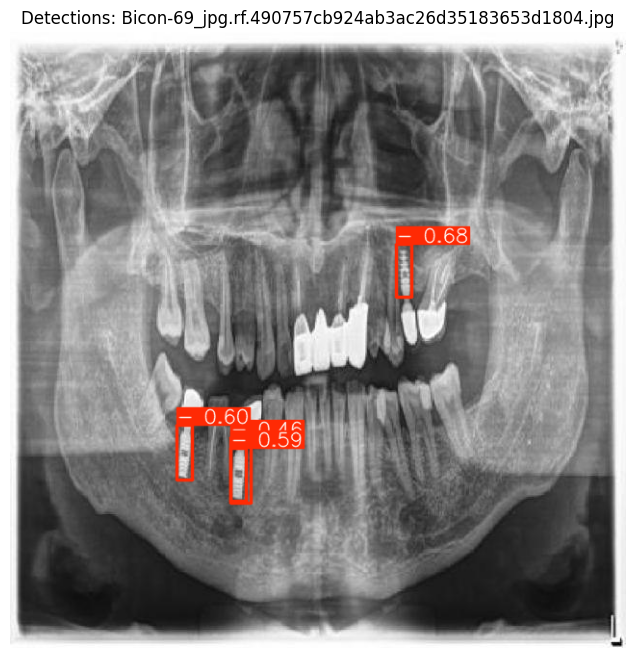

Saved results for Bicon-69_jpg.rf.490757cb924ab3ac26d35183653d1804.jpg to /content/sample_data/detected_Bicon-69_jpg.rf.490757cb924ab3ac26d35183653d1804.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-285_jpg.rf.067bfff7c300b16d093d875d090d1b04.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.6ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


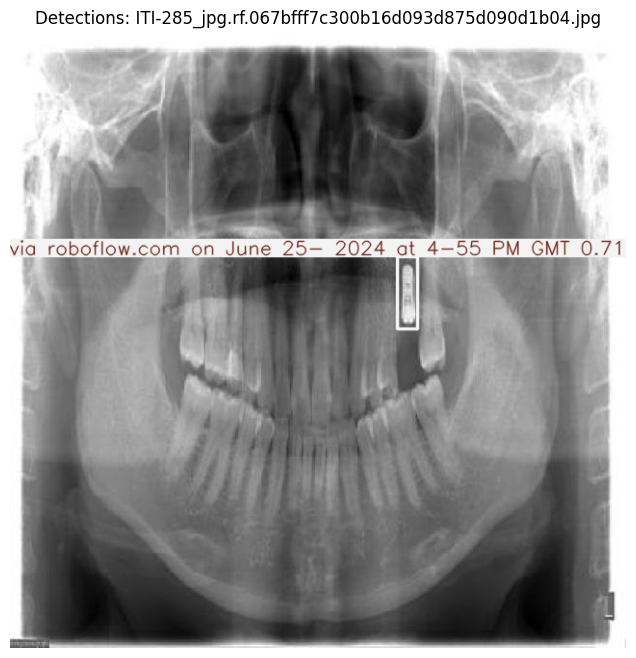

Saved results for ITI-285_jpg.rf.067bfff7c300b16d093d875d090d1b04.jpg to /content/sample_data/detected_ITI-285_jpg.rf.067bfff7c300b16d093d875d090d1b04.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-431_jpg.rf.e12eb1e51491c5418d1f37fccebe8661.jpg: 640x640 1 -, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


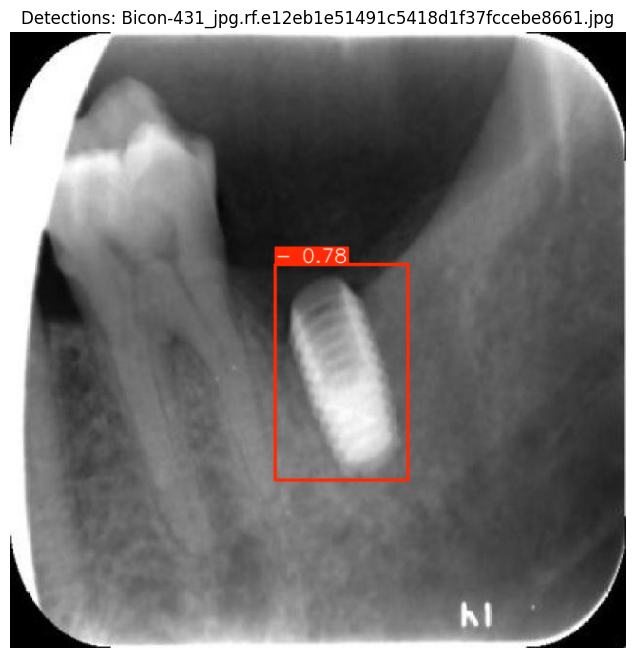

Saved results for Bicon-431_jpg.rf.e12eb1e51491c5418d1f37fccebe8661.jpg to /content/sample_data/detected_Bicon-431_jpg.rf.e12eb1e51491c5418d1f37fccebe8661.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-350_jpg.rf.d0ad9821d19dfb52ffe468eb9ba8acbe.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


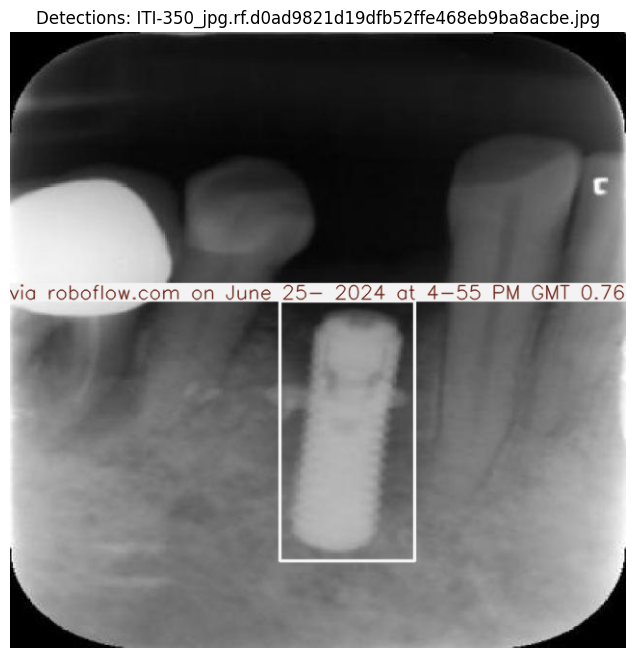

Saved results for ITI-350_jpg.rf.d0ad9821d19dfb52ffe468eb9ba8acbe.jpg to /content/sample_data/detected_ITI-350_jpg.rf.d0ad9821d19dfb52ffe468eb9ba8acbe.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-254_jpg.rf.450f5a0080c49437e5a44342a435072f.jpg: 640x640 1 -, 37.0ms
Speed: 2.8ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


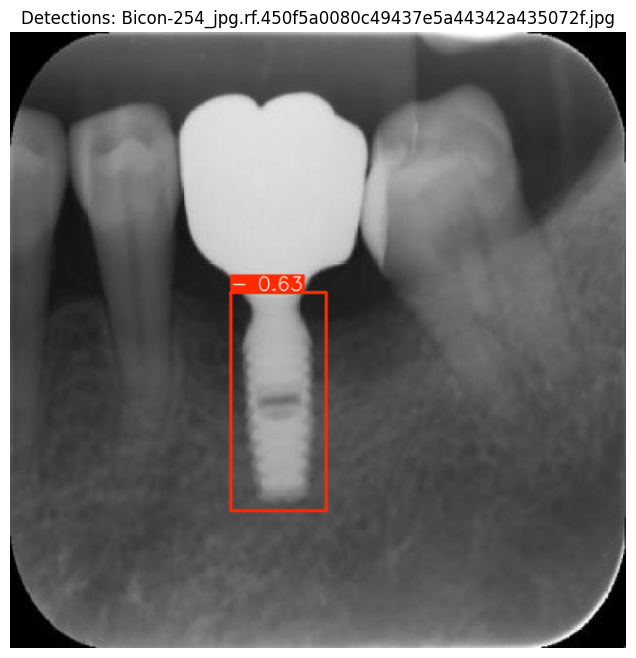

Saved results for Bicon-254_jpg.rf.450f5a0080c49437e5a44342a435072f.jpg to /content/sample_data/detected_Bicon-254_jpg.rf.450f5a0080c49437e5a44342a435072f.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-344_jpg.rf.8aa8bd17e99bfcea15481bf0e448e1bd.jpg: 640x640 2 -s, 37.2ms
Speed: 2.8ms preprocess, 37.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


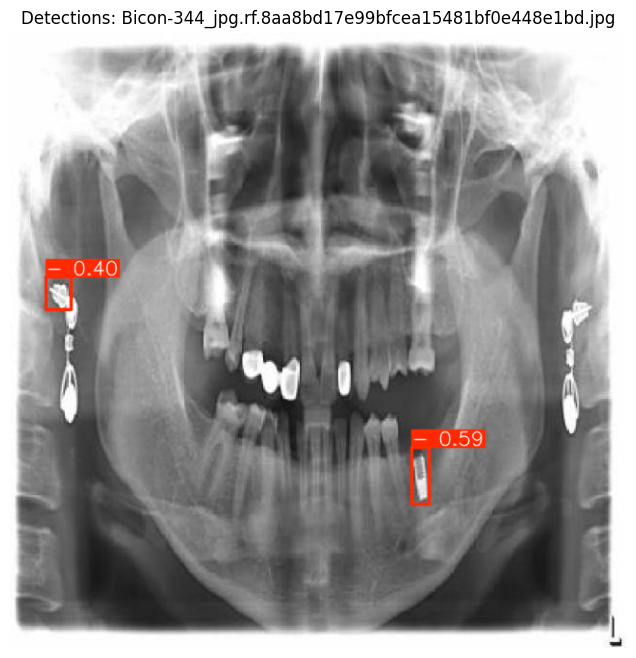

Saved results for Bicon-344_jpg.rf.8aa8bd17e99bfcea15481bf0e448e1bd.jpg to /content/sample_data/detected_Bicon-344_jpg.rf.8aa8bd17e99bfcea15481bf0e448e1bd.jpg

image 1/1 /content/Implant-Doctor-1/test/images/Bicon-292_jpg.rf.a9fbe4d2f3c1e526a7c140ce3337e0f9.jpg: 640x640 1 -, 37.0ms
Speed: 2.7ms preprocess, 37.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


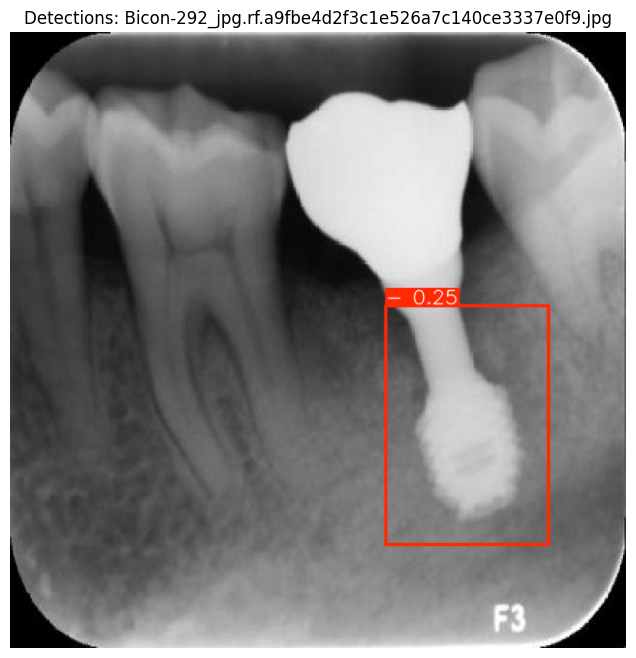

Saved results for Bicon-292_jpg.rf.a9fbe4d2f3c1e526a7c140ce3337e0f9.jpg to /content/sample_data/detected_Bicon-292_jpg.rf.a9fbe4d2f3c1e526a7c140ce3337e0f9.jpg

image 1/1 /content/Implant-Doctor-1/test/images/ITI-74_jpg.rf.39a3ce9d2b40fe190859484d9746199c.jpg: 640x640 1 This dataset was exported via roboflow.com on June 25- 2024 at 4-55 PM GMT, 38.5ms
Speed: 2.7ms preprocess, 38.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


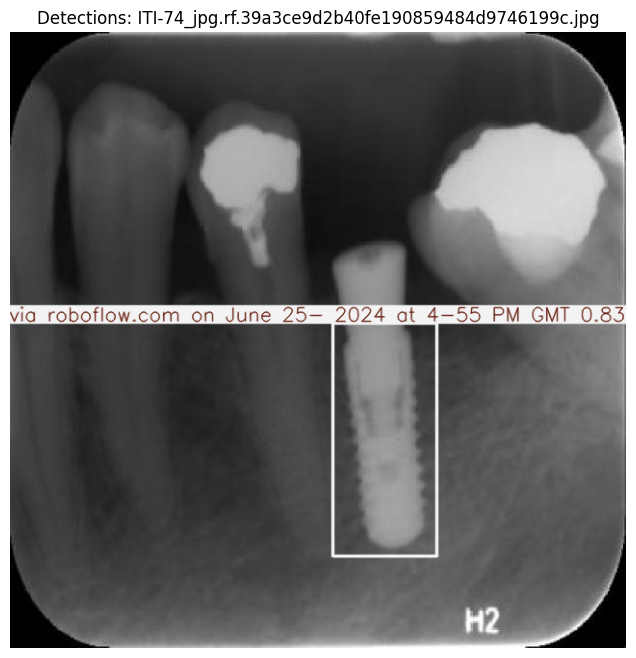

Saved results for ITI-74_jpg.rf.39a3ce9d2b40fe190859484d9746199c.jpg to /content/sample_data/detected_ITI-74_jpg.rf.39a3ce9d2b40fe190859484d9746199c.jpg



In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path configuration
test_dir = "/content/Implant-Doctor-1/test/images"  # Replace with your test directory path
output_dir = "/content/sample_data"  # Where to save results
os.makedirs(output_dir, exist_ok=True)

# Get all image files in test directory
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']
test_images = [f for f in os.listdir(test_dir)
              if os.path.splitext(f)[1].lower() in image_extensions]

# Process each image
for img_name in test_images:
    img_path = os.path.join(test_dir, img_name)

    # Run inference
    results = model(img_path)  # Your YOLOv11m model

    # Show results (inline if in notebook)
    displayed_image = results[0].plot()  # Returns image with detections
    plt.figure(figsize=(12, 8))
    plt.imshow(displayed_image)
    plt.axis('off')
    plt.title(f"Detections: {img_name}")
    plt.show()

    # Save results
    output_path = os.path.join(output_dir, f"detected_{img_name}")
    Image.fromarray(displayed_image).save(output_path)
    print(f"Saved results for {img_name} to {output_path}")

print(f"\nFinished processing {len(test_images)} images. Results saved to {output_dir}")